# Summarize models

This notebook summarizes all metrics required for model comparison including the following:

  1. Standardized predictor distributions
  1. Model residuals by predictor
  1. Forecast errors overall and by timepoint
  1. Model coefficients averages and by timepoint
  
## Table of contents

 1. [Import and define functions](#Import-and-define-functions)
 1. [Define configuration settings](#Define-configuration-settings)
 1. [Load data](#Load-data)
 1. [Summarize predictors](#Summarize-predictors)
 1. [Summarize model residuals](#Summarize-model-residuals)
 1. [Summarize observed and predicted distances](#Summarize-observed-and-predicted-distances)
 1. [Summarize model forecasting error](#Summarize-model-forecasting-error)

## Import and define functions
[back to top](#Summarize-models)

In [1]:
import Bio.SeqIO
from collections import defaultdict
import glob
import json
import matplotlib as mpl
import matplotlib.dates as mdates
import matplotlib.gridspec as gridspec
import matplotlib.pyplot as plt
import networkx as nx
import numpy as np
import pandas as pd
from scipy.stats import pearsonr
from scipy.stats import linregress
import seaborn as sns
import sys

%matplotlib inline

In [2]:
sys.path.insert(0, "../src")

In [3]:
from fit_model import DistanceExponentialGrowthModel

In [4]:
sns.set_style("white")
plt.style.use("huddlej")

In [5]:
mpl.rcParams['savefig.dpi'] = 200
mpl.rcParams['figure.dpi'] = 200
mpl.rcParams['font.weight'] = 300
mpl.rcParams['axes.labelweight'] = 300
mpl.rcParams['font.size'] = 18

In [6]:
!pwd

/Users/jlhudd/projects/nextstrain/flu-forecasting/analyses


In [7]:
def mean_absolute_error(observed, estimated, **kwargs):
    """
    Calculates the mean absolute error between observed and estimated values.

    Parameters
    ----------
    observed : numpy.ndarray
        observed values

    estimated : numpy.ndarray
        estimated values

    Returns
    -------
    float :
        mean absolute error between observed and estimated values
    """
    return np.mean(np.abs(observed - estimated))

def root_mean_square_error(observed, estimated, **kwargs):
    """
    Calculates the root mean square error between observed and estimated values.

    Parameters
    ----------
    observed : numpy.ndarray
        observed values

    estimated : numpy.ndarray
        estimated values

    Returns
    -------
    float :
        root mean square error between observed and estimated values
    """
    return np.sqrt(np.mean((observed - estimated) ** 2))

def mean_square_error(observed, estimated, **kwargs):
    """
    Calculates the mean square error between observed and estimated values.

    Parameters
    ----------
    observed : numpy.ndarray
        observed values

    estimated : numpy.ndarray
        estimated values

    Returns
    -------
    float :
        mean square error between observed and estimated values
    """
    return np.mean((observed - estimated) ** 2)

def facet_time_plot(data, value, value_label, timepoint_column="timepoint", predictors_column="predictors", hue=None,
                    height=4, aspect=1, col_order=None, col_wrap=4, markersize=15):
    g = sns.FacetGrid(data, col=predictors_column, col_order=col_order, col_wrap=col_wrap, hue=hue, height=height, aspect=aspect)
    g.map_dataframe(sns.lineplot, x=timepoint_column, y=value, estimator="mean", ci="sd", markers=True, dashes=False,
                   style=predictors_column, markersize=markersize)
    g.set_axis_labels("Date", value_label)

    for ax in g.axes.flatten():
        ax.axhline(y=0, color="#cccccc", zorder=-10)

        #start, end = [int(value) for value in ax.get_xlim()]
        #end = end + 1
        #stepsize = 2.0
        #ax.xaxis.set_ticks(np.arange(start, end, stepsize))

        #labels = ax.get_xticklabels()
        #output = plt.setp(labels, rotation=30)
        
    plt.gcf().autofmt_xdate()
    return g

## Define configuration settings
[back to top](#Summarize-models)

In [8]:
"""
predictor_names_order = [
    "naive",
    "delta_frequency",
    "lbi",
    "ep_x",
    "cTiterSub_x",
    "ne_star",
    "dms_star"
]
"""

predictor_names_order = [
    "naive",
    "fitness",
    "ep_x",
    "ne_star",
    "lbi",
    "delta_frequency",
    "ep_x-ne_star",
    "lbi-ne_star",
    "lbi-ep_x-ne_star"
]

minimal_predictor_names_order = [
    "naive",
    "ep_x",
    "ne_star",
    "lbi",
    "lbi-ep_x-ne_star"
]

In [9]:
data_root = "../results/builds/h3n2/90_viruses_per_month/sample_0/2000-10-01--2015-10-01/"
data_root = "../results/builds/h3n2/1_viruses_per_month/sample_0/2000-10-01--2015-10-01/"
data_root = "../results/builds/h3n2/5_viruses_per_month/sample_0/1994-10-01--2015-10-01/"

data_root = "../results/builds/h3n2/10_viruses_per_month/sample_0/1994-10-01--2015-10-01/"

data_root = "../results/builds/simulations/100/2000-10-01--2100-10-01/"
#data_root = "../results/builds/simulations/20/2000-10-01--2100-10-01/"
#data_root = "../results/builds/h3n2/30_viruses_per_month/sample_0/1994-10-01--2015-10-01/"

data_root = "../results/builds/simulations/100/2010-10-01--2030-10-01/"

## Load data
[back to top](#Summarize-models)

In [10]:
tip_attributes_df = pd.read_table(data_root + "tip_attributes_with_weighted_distances.tsv", parse_dates=["timepoint"])

In [11]:
observed_weighted_distances = tip_attributes_df.loc[:, ["timepoint", "strain", "frequency", "weighted_distance_to_future"]].copy()

In [12]:
observed_weighted_distances["y"] = observed_weighted_distances["weighted_distance_to_future"]

In [13]:
model_jsons = glob.glob(data_root + "models_by_distances/*.json")

In [14]:
models_by_predictors = {}

for model_json in model_jsons:
    with open(model_json, "r") as fh:
        data = json.load(fh)
        models_by_predictors["-".join(data["predictors"])] = data

In [15]:
models_by_predictors["lbi"]["cost_function"]

'diffsum'

In [16]:
models_by_predictors["lbi"]["l1_lambda"]

0.01

In [17]:
models_by_predictors["lbi"]["training_window"]

6

In [18]:
models_by_predictors["lbi"]["pseudocount"]

In [19]:
type(models_by_predictors["lbi"])

dict

In [20]:
sorted(models_by_predictors.keys())

['delta_frequency',
 'ep_x',
 'ep_x-ne_star',
 'fitness',
 'lbi',
 'lbi-ep_x-ne_star',
 'lbi-ne_star',
 'naive',
 'ne_star']

In [21]:
models_by_predictors["lbi"].keys()

dict_keys(['scores', 'predictors', 'cv_error_mean', 'cv_error_std', 'coefficients_mean', 'coefficients_std', 'mean_stds_mean', 'mean_stds_std', 'cost_function', 'l1_lambda', 'delta_months', 'training_window', 'pseudocount'])

In [22]:
models_by_predictors["lbi"]["scores"][0].keys()

dict_keys(['predictors', 'training_data', 'training_n', 'training_error', 'coefficients', 'mean_stds', 'validation_data', 'validation_n', 'validation_error', 'last_training_timepoint', 'validation_timepoint'])

In [23]:
models_by_predictors["lbi"]["scores"][0]["training_n"]

822

In [24]:
models_by_predictors["lbi"]["scores"][0]["validation_data"].keys()

dict_keys(['y', 'y_hat'])

In [25]:
models_by_predictors["lbi"]["scores"][0]["coefficients"]

[3.9411883471852063]

In [26]:
models_by_predictors["lbi"]["scores"][0]["mean_stds"]

[0.049589071840739976]

In [27]:
len(models_by_predictors["lbi"]["scores"])

23

Build data frames for plotting from the model scores.

In [28]:
overall_errors = []
errors_by_time = []
overall_coefficients = []
coefficients_by_time = []
mean_stds_by_time = []
frequency_dfs = []
residuals_dfs = []

for predictors, model in models_by_predictors.items():
    overall_errors.append({
        "predictors": predictors,
        "cv_error_mean": model["cv_error_mean"],
        "cv_error_std": model["cv_error_std"]
    })

    for predictor, mean, std in zip(model["predictors"], model["coefficients_mean"], model["coefficients_std"]):
        overall_coefficients.append({
            "predictors": predictors,
            "predictor": predictor,
            "mean": mean,
            "std": std
        })
    
    for scores in model["scores"]:
        errors_by_time.append({
            "predictors": predictors,
            "validation_timepoint": pd.to_datetime(scores["validation_timepoint"]),
            "validation_error": scores["validation_error"],
            "validation_n": scores["validation_n"]
        })
        
        for predictor, coefficient, mean_std in zip(model["predictors"], scores["coefficients"], scores["mean_stds"]):
            coefficients_by_time.append({
                "predictors": predictors,
                "predictor": predictor,
                "coefficient": coefficient,
                "validation_timepoint": pd.to_datetime(scores["validation_timepoint"])
            })
            
            mean_stds_by_time.append({
                "predictors": predictors,
                "predictor": predictor,
                "mean_std": mean_std,
                "validation_timepoint": scores["validation_timepoint"]
            })
        
        #X = pd.DataFrame(scores["validation_data"]["X"])
        #X["timepoint"] = pd.to_datetime(X["timepoint"])

        y = pd.DataFrame(scores["validation_data"]["y"])
        y["timepoint"] = pd.to_datetime(y["timepoint"])
        y["future_timepoint"] = pd.to_datetime(y["future_timepoint"])

        y_hat = pd.DataFrame(scores["validation_data"]["y_hat"])
        y_hat["y"] = y_hat["y"] + 2.97
        y_hat["timepoint"] = pd.to_datetime(y_hat["timepoint"])

        frequency_df = y_hat.merge(
            observed_weighted_distances,
            on=["timepoint", "strain", "frequency"],
            suffixes=["_hat", ""]
        )
        frequency_df["residual"] = frequency_df["y"] - frequency_df["y_hat"]
        frequency_df["validation_timepoint"] = pd.to_datetime(scores["validation_timepoint"])
        frequency_df["predictors"] = predictors
        frequency_dfs.append(frequency_df)

        #training_X = pd.DataFrame(scores["training_data"]["X"])
        #training_X["timepoint"] = pd.to_datetime(training_X["timepoint"])

        training_y = pd.DataFrame(scores["training_data"]["y"])
        training_y["timepoint"] = pd.to_datetime(training_y["timepoint"])
        training_y_hat = pd.DataFrame(scores["training_data"]["y_hat"])
        training_y_hat["y"] = training_y_hat["y"] + 2.97
        training_y_hat["timepoint"] = pd.to_datetime(training_y_hat["timepoint"])
        residual_df = training_y_hat.merge(
            observed_weighted_distances,
            on=["timepoint", "strain", "frequency"],
            suffixes=["_hat", ""]
        )
        residual_df["residual"] = residual_df["y"] - residual_df["y_hat"]
        residual_df["validation_timepoint"] = pd.to_datetime(scores["validation_timepoint"])
        residual_df["predictors"] = predictors

        residuals_dfs.append(residual_df)
        
overall_errors_df = pd.DataFrame(overall_errors)
errors_by_time_df = pd.DataFrame(errors_by_time)
overall_coefficients_df = pd.DataFrame(overall_coefficients)
coefficients_by_time_df = pd.DataFrame(coefficients_by_time)
mean_stds_by_time_df = pd.DataFrame(mean_stds_by_time)
frequency_df = pd.concat(frequency_dfs, ignore_index=True)
residual_df = pd.concat(residuals_dfs, ignore_index=True)

In [29]:
errors_by_time_df["validation_timepoint"].head()

0   2018-10-01
1   2019-04-01
2   2019-10-01
3   2020-04-01
4   2020-10-01
Name: validation_timepoint, dtype: datetime64[ns]

In [30]:
training_y.head()

,frequency,future_timepoint,strain,timepoint,weighted_distance_to_future,weighted_distance_to_present,y
0,0.000001,2023-10-01,sample_2292_5,2022-10-01,16.024101,11.966277,16.024101
1,0.000001,2023-10-01,sample_2292_6,2022-10-01,14.977615,9.932448,14.977615
2,0.000001,2023-10-01,sample_2292_9,2022-10-01,14.950585,9.887867,14.950585
3,0.000004,2023-10-01,sample_2296_4,2022-10-01,17.910819,12.154995,17.910819
4,0.000004,2023-10-01,sample_2296_6,2022-10-01,13.870777,8.630087,13.870777


In [31]:
y_hat.head()

,fitness,frequency,projected_frequency,strain,timepoint,weighted_distance_to_future,weighted_distance_to_present,y
0,-6.829129,0.000001,2.953828e-11,sample_2892_1,2029-10-01,32.167281,30.111098,35.710328
1,3.919827,0.000001,1.375934e-06,sample_2892_10,2029-10-01,28.366157,26.101922,31.784767
2,-4.149577,0.000001,4.306257e-10,sample_2892_2,2029-10-01,20.631362,17.875770,19.537361
3,3.270270,0.000001,7.186188e-07,sample_2892_5,2029-10-01,18.024669,16.023268,15.610255
4,-3.630919,0.000001,7.233534e-10,sample_2892_6,2029-10-01,16.762421,15.548447,14.859609


In [32]:
frequency_df.head()

,fitness,frequency,projected_frequency,strain,timepoint,weighted_distance_to_future_hat,weighted_distance_to_present,y_hat,weighted_distance_to_future,y,residual,validation_timepoint,predictors
0,1.400036,0.000001,7.132491e-09,sample_1792_1,2018-10-01,13.257480,12.452205,9.888390,13.257480,13.257480,3.369090,2018-10-01,fitness
1,3.414538,0.000001,5.347224e-08,sample_1792_10,2018-10-01,14.406171,13.588543,12.617650,14.406171,14.406171,1.788521,2018-10-01,fitness
2,4.249744,0.000001,1.232689e-07,sample_1792_3,2018-10-01,21.965162,19.062104,23.010211,21.965162,21.965162,-1.045049,2018-10-01,fitness
3,-4.470217,0.000004,8.051608e-11,sample_1796_10,2018-10-01,14.334199,13.482480,15.136413,14.334199,14.334199,-0.802214,2018-10-01,fitness
4,3.807531,0.000004,3.168565e-07,sample_1796_2,2018-10-01,21.950493,19.157479,22.988504,21.950493,21.950493,-1.038011,2018-10-01,fitness


In [33]:
residual_df.head()

,fitness,frequency,projected_frequency,strain,timepoint,weighted_distance_to_future_hat,weighted_distance_to_present,y_hat,weighted_distance_to_future,y,residual,validation_timepoint,predictors
0,-0.639651,0.000001,8.348518e-11,sample_1092_10,2011-10-01,15.012715,12.116577,12.540889,15.012715,15.012715,2.471826,2018-10-01,fitness
1,1.536516,0.000001,7.357103e-10,sample_1092_2,2011-10-01,19.590264,16.813736,17.530921,19.590264,19.590264,2.059343,2018-10-01,fitness
2,0.782334,0.000001,3.460747e-10,sample_1092_5,2011-10-01,17.916692,15.870513,16.296329,17.916692,17.916692,1.620363,2018-10-01,fitness
3,-17.096776,0.000001,5.947998e-18,sample_1092_6,2011-10-01,11.909871,8.207999,7.895599,11.909871,11.909871,4.014272,2018-10-01,fitness
4,-0.486992,0.000001,9.725423e-11,sample_1092_9,2011-10-01,19.818186,17.554672,18.294960,19.818186,19.818186,1.523226,2018-10-01,fitness


In [34]:
residual_df.shape

(270837, 13)

In [35]:
errors_by_time_df.head()

,predictors,validation_error,validation_n,validation_timepoint
0,fitness,-0.223293,102,2018-10-01
1,fitness,-0.235968,102,2019-04-01
2,fitness,-0.067011,101,2019-10-01
3,fitness,-0.151896,99,2020-04-01
4,fitness,-0.054867,103,2020-10-01


In [36]:
overall_errors_df.sort_values("cv_error_mean")

,cv_error_mean,cv_error_std,predictors
2,-0.163612,0.152886,lbi-ep_x-ne_star
8,-0.158729,0.152132,lbi-ne_star
1,-0.158673,0.152099,lbi
0,-0.076343,0.176380,fitness
5,-0.015400,0.155713,delta_frequency
3,-0.010162,0.175811,ne_star
4,-0.007268,0.212224,ep_x-ne_star
6,0.083601,0.197052,ep_x
7,0.095835,0.166637,naive


## Summarize predictors
[back to top](#Summarize-models)

In [133]:
individual_predictor_names_order = [
    predictor
    for predictor in predictor_names_order
    if not "-" in predictor and predictor != "naive"
]

In [134]:
individual_predictor_names_order

['fitness', 'ep_x', 'ne_star', 'lbi', 'delta_frequency']

In [38]:
long_predictors_df = tip_attributes_df.melt(
    id_vars=["strain", "timepoint"],
    value_vars=individual_predictor_names_order,
    var_name="predictor",
    value_name="predictor_value"
)

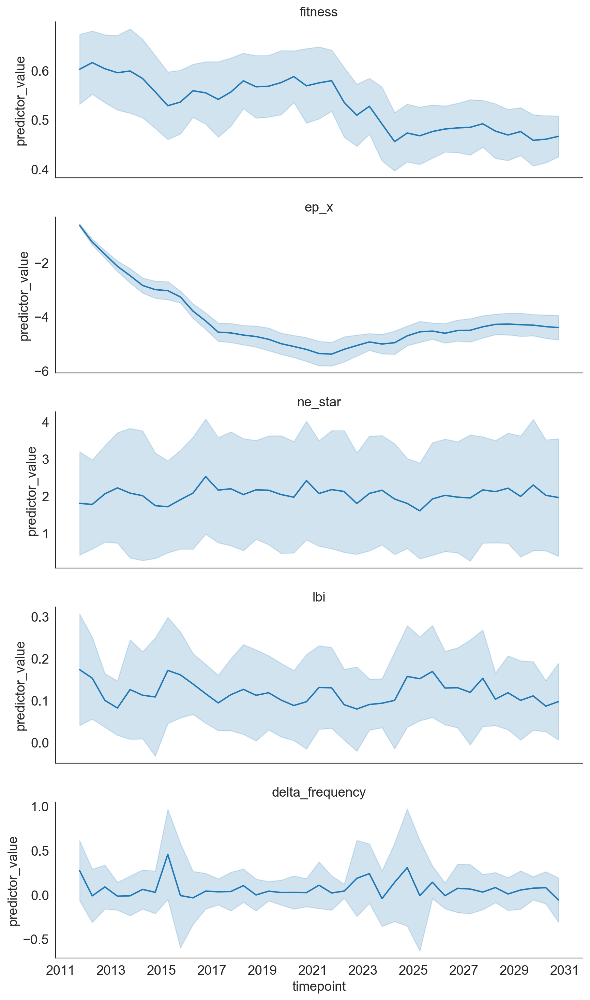

In [39]:
g = sns.FacetGrid(long_predictors_df, row="predictor", aspect=3, sharey=False)
g.map(sns.lineplot, "timepoint", "predictor_value", ci="sd")
g.set_titles("{row_name}")

plt.savefig("../manuscript/figures/predictors_by_timepoint.png")

In [40]:
mean_stds_by_time_df.head()

,mean_std,predictor,predictors,validation_timepoint
0,0.070092,fitness,fitness,2018-10-01
1,0.068984,fitness,fitness,2019-04-01
2,0.068918,fitness,fitness,2019-10-01
3,0.068445,fitness,fitness,2020-04-01
4,0.067622,fitness,fitness,2020-10-01


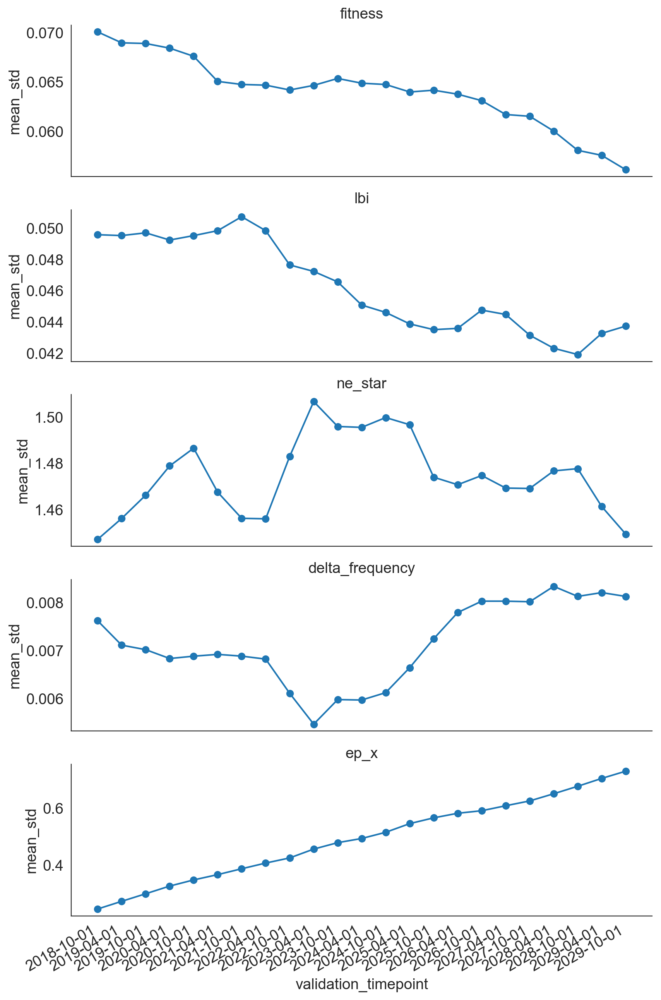

In [41]:
g = sns.FacetGrid(
    mean_stds_by_time_df[mean_stds_by_time_df["predictors"].isin(individual_predictor_names_order)],
    row="predictor",
    aspect=3,
    sharey=False
)
g.map(plt.plot, "validation_timepoint", "mean_std", marker="o")
g.set_titles("{row_name}")

plt.gcf().autofmt_xdate()

In [42]:
min_max_mean_std = mean_stds_by_time_df.groupby("predictors")["mean_std"].aggregate(["min", "max"]).reset_index()

In [43]:
min_max_mean_std["delta"] = min_max_mean_std["max"] - min_max_mean_std["min"]

In [44]:
min_max_mean_std.sort_values("delta")

,predictors,min,max,delta
7,naive,0.000000,0.000000,0.000000
0,delta_frequency,0.005469,0.008338,0.002868
4,lbi,0.041936,0.050739,0.008803
3,fitness,0.056135,0.070092,0.013958
8,ne_star,1.447213,1.506828,0.059614
1,ep_x,0.245672,0.731422,0.485750
2,ep_x-ne_star,0.245672,1.506828,1.261156
5,lbi-ep_x-ne_star,0.041936,1.506828,1.464892
6,lbi-ne_star,0.041936,1.506828,1.464892


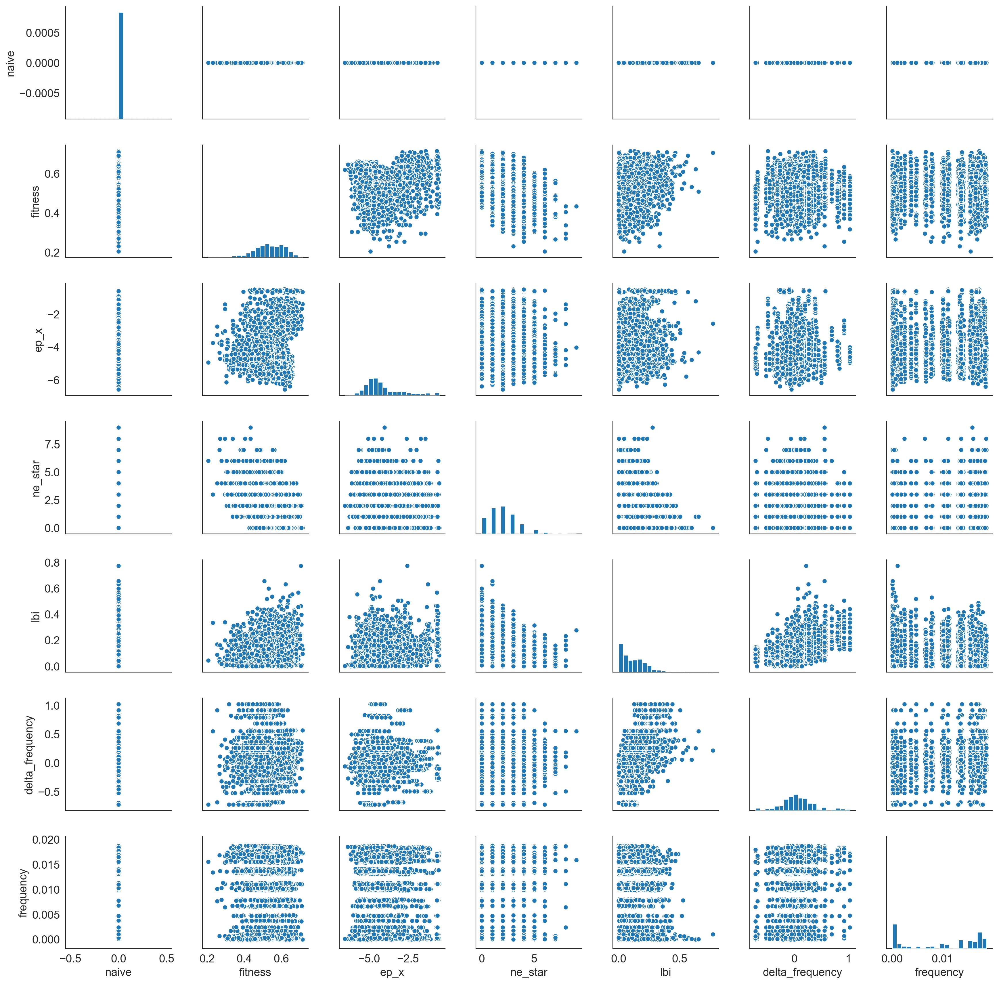

In [45]:
variables_to_plot = [predictor for predictor in predictor_names_order if not "-" in predictor] + ["frequency"]
sns.pairplot(tip_attributes_df.dropna(), vars=variables_to_plot, diag_kind="hist", diag_kws={"bins": 20})

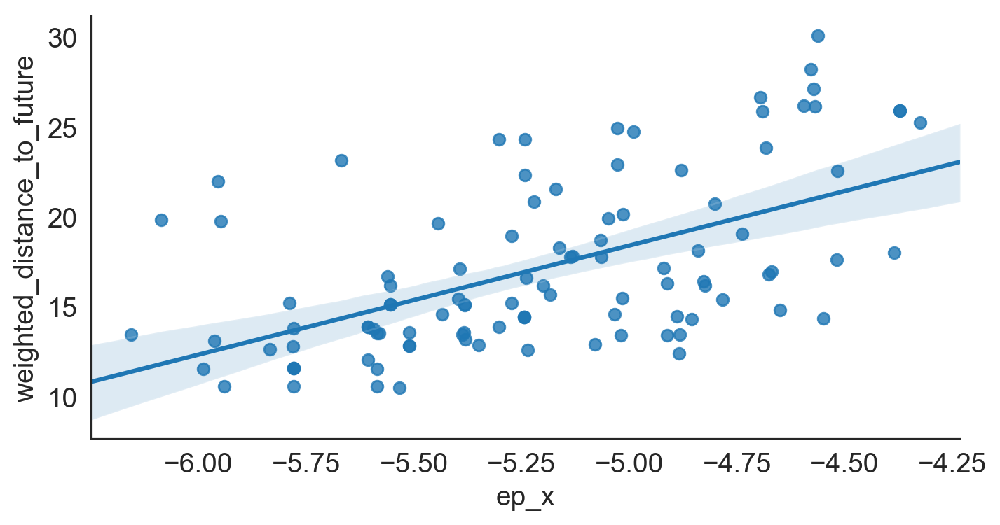

In [46]:
fig, ax = plt.subplots(1, 1, figsize=(8, 4))
sns.regplot(
    "ep_x",
    "weighted_distance_to_future",
    tip_attributes_df.loc[tip_attributes_df["timepoint"] == "2020-10-01"],
    ax=ax
)

In [47]:
"""sns.lmplot(
    "ep_x",
    "weighted_distance_to_future",
    tip_attributes_df,
    col="timepoint",
    col_wrap=4,
    sharex=False,
    sharey=False
)"""

'sns.lmplot(\n    "ep_x",\n    "weighted_distance_to_future",\n    tip_attributes_df,\n    col="timepoint",\n    col_wrap=4,\n    sharex=False,\n    sharey=False\n)'

## Summarize model residuals
[back to top](#Summarize-models)

In [48]:
residuals_by_timepoint = residual_df.groupby(["predictors", "timepoint"])["residual"].sum().reset_index()

In [49]:
residuals_by_timepoint.head()

,predictors,timepoint,residual
0,delta_frequency,2011-10-01,125.613212
1,delta_frequency,2012-04-01,-958.572908
2,delta_frequency,2012-10-01,-878.632631
3,delta_frequency,2013-04-01,-81.643338
4,delta_frequency,2013-10-01,520.286695


In [50]:
max_lags = 18

### Residuals by predictor

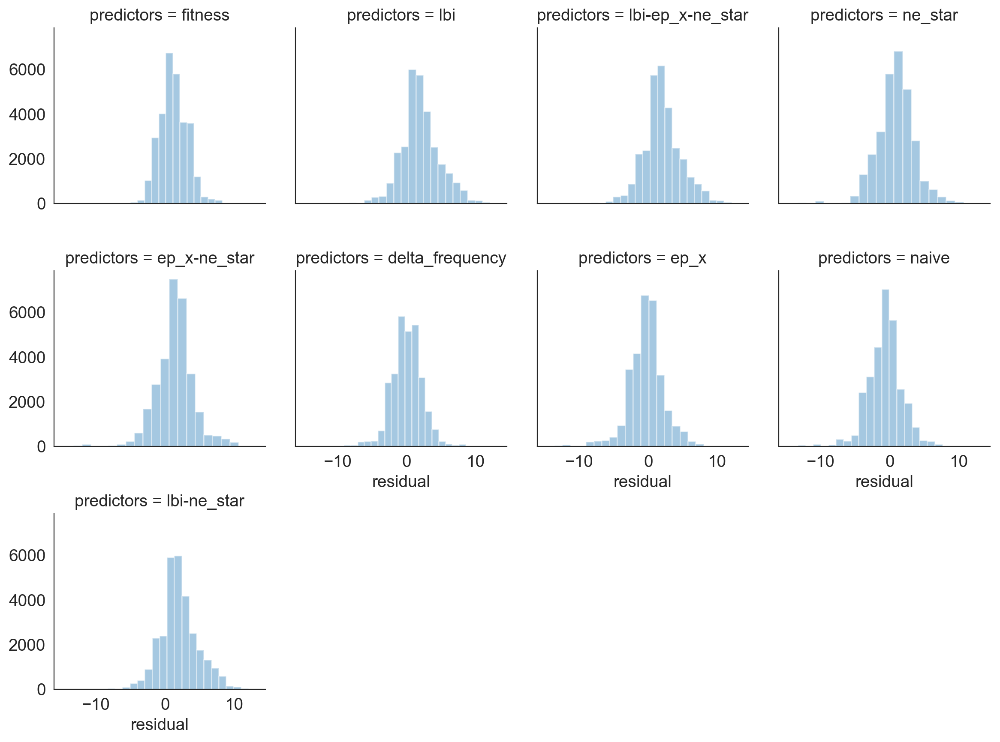

In [51]:
g = sns.FacetGrid(residual_df, col="predictors", col_wrap=4)
g.map(sns.distplot, "residual", bins=20, kde=False)

In [52]:
residual_df.groupby("predictors")["residual"].median().sort_values()

predictors
naive              -0.559262
ep_x               -0.202400
delta_frequency     0.050708
ne_star             0.886102
fitness             1.065250
ep_x-ne_star        1.451770
lbi                 1.615696
lbi-ne_star         1.657959
lbi-ep_x-ne_star    1.675585
Name: residual, dtype: float64

In [53]:
residual_df.groupby("predictors")["residual"].count()

predictors
delta_frequency     30093
ep_x                30093
ep_x-ne_star        30093
fitness             30093
lbi                 30093
lbi-ep_x-ne_star    30093
lbi-ne_star         30093
naive               30093
ne_star             30093
Name: residual, dtype: int64

In [54]:
(residual_df["residual"] < -0.01).sum()

92918

### Residuals by timepoint

In [55]:
residuals_by_timepoint.head()

,predictors,timepoint,residual
0,delta_frequency,2011-10-01,125.613212
1,delta_frequency,2012-04-01,-958.572908
2,delta_frequency,2012-10-01,-878.632631
3,delta_frequency,2013-04-01,-81.643338
4,delta_frequency,2013-10-01,520.286695


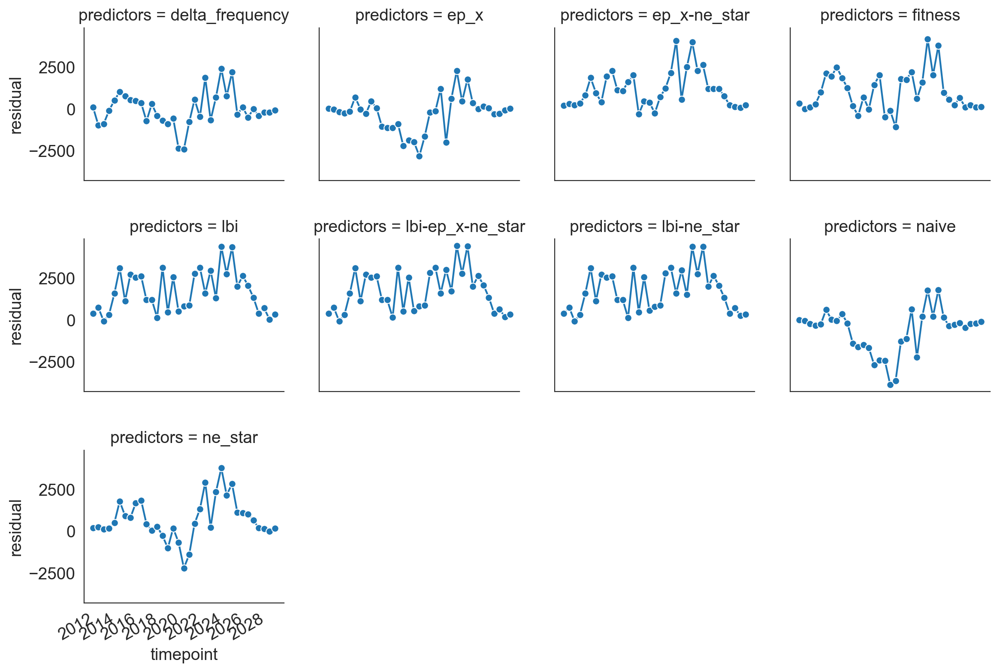

In [56]:
g = sns.FacetGrid(residuals_by_timepoint, col="predictors", col_wrap=4)
g.map(sns.lineplot, "timepoint", "residual", marker="o", linestyle="")
plt.gcf().autofmt_xdate()

In [57]:
np.abs(residuals_by_timepoint[residuals_by_timepoint["predictors"] == "lbi"]["residual"].values - residuals_by_timepoint[residuals_by_timepoint["predictors"] == "naive"]["residual"].values)

array([ 387.21957316,  782.13514111,  143.63298749,  647.68348052,
       1839.80434135, 2501.53377619, 1100.65068177, 2773.95901166,
       2184.33665802, 2830.96556134, 2593.09123186, 2819.0775737 ,
       1609.23480132, 4808.53053661, 3147.53737629, 4964.57401008,
       2945.74541504, 4694.35117938, 4499.38795249, 4048.28014787,
       4265.33205499,  947.11665936, 5196.79962817, 1093.68451498,
       2609.33584216, 2536.16998008, 2548.83579656, 1858.85552808,
       3004.62734166, 2335.18000742, 1518.41656349,  838.66241599,
        950.21963617,  246.64378755,  453.06709373])

### Autocorrelation of residuals

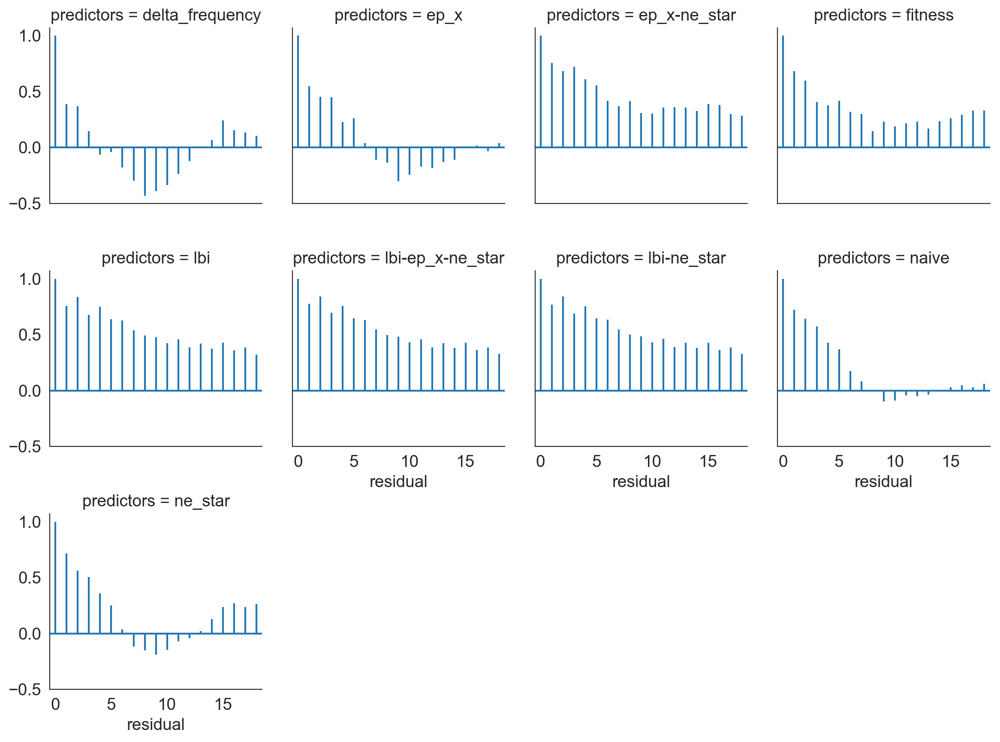

In [58]:
g = sns.FacetGrid(residuals_by_timepoint, col="predictors", col_wrap=4)
g.map(plt.acorr, "residual", maxlags=max_lags)

for ax in g.axes.flatten():
    ax.set_xlim(-0.5, max_lags + 0.5)

## Summarize observed and predicted distances
[back to top](#Summarize-models)

$$
d_{i}(x(t)) = \sum_{j}x_{j}d_{ij}
$$

$$
u = t + \Delta{t}
$$

$$
\hat{x}_{i}(t, u) = x_{i}(t)e^{(f_{i}(t)(u - t))}
$$

$$
y = d_{i}(x(u))
$$

$$
\hat{y} = d_{i}(\hat{x}(t, u))
$$

$$
D(x(t), x(u)) = \sum_{i}x_{i}d_{i}(u)
$$

$$
D(\hat{x}(t, u), x(u)) = \sum_{i}x_{i}e^{(f_{i}(t)(u - t))}d_{i}(u)
$$

$$
L = \sum_{t}D(\hat{x}(t, u), x(u))
$$

In [59]:
frequency_df["observed_rank"] = frequency_df["y"] # / frequency_df["frequency"]
frequency_df["estimated_rank"] = frequency_df["y_hat"] # / frequency_df["frequency"]

In [60]:
regressions = []
for predictors, group_df in frequency_df.groupby(["predictors"]):
    slope, intercept, r_value, p_value, std_err = linregress(
        group_df["y"],
        group_df["y_hat"]
    )
    
    regressions.append({
        "predictors": predictors,
        "slope": slope,
        "intercept": intercept,
        "r_value": r_value,
        "r_2": r_value ** 2,
        "p_value": p_value
    })

regressions = pd.DataFrame(regressions).sort_values(by="r_2", ascending=False)

In [61]:
regressions_order = regressions["predictors"].values

In [62]:
regressions_order

array(['fitness', 'delta_frequency', 'ne_star', 'naive',
       'lbi-ep_x-ne_star', 'lbi', 'lbi-ne_star', 'ep_x', 'ep_x-ne_star'],
      dtype=object)

In [63]:
max_y = max(frequency_df["y"].max() + frequency_df["y"].std(), frequency_df["y_hat"].max() + frequency_df["y_hat"].std())

In [64]:
data_to_plot = frequency_df[frequency_df["predictors"] == "lbi"]

In [65]:
minimum_observed_distance = data_to_plot.groupby("validation_timepoint")["observed_rank"].min().reset_index()

In [66]:
minimum_estimated_distance = data_to_plot.groupby("validation_timepoint")["estimated_rank"].min().reset_index()

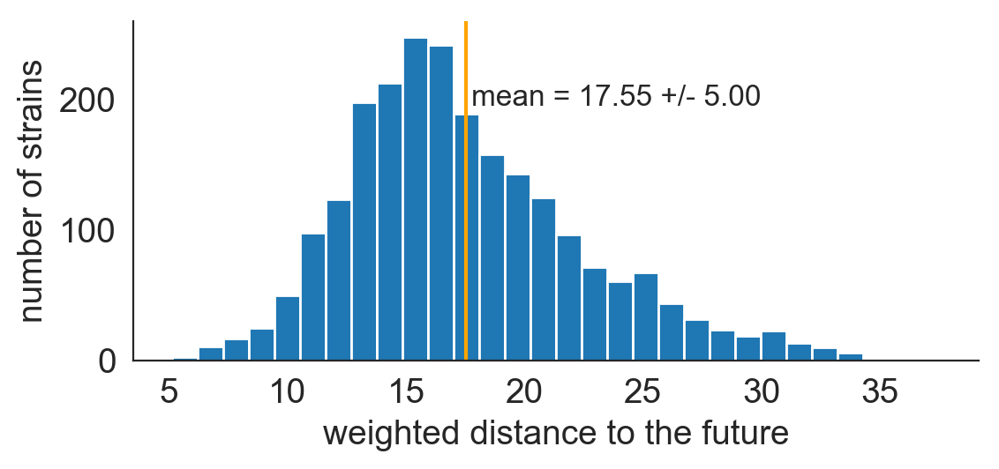

In [67]:
fig, ax = plt.subplots(1, 1, figsize=(6, 3))
ax.hist(frequency_df[frequency_df["predictors"] == "naive"]["y"], bins=30)
ax.set_xlabel("weighted distance to the future")
ax.set_ylabel("number of strains")

mean_y = frequency_df[frequency_df["predictors"] == "naive"]["y"].mean()
std_y = frequency_df[frequency_df["predictors"] == "naive"]["y"].std()
ax.axvline(
    x=mean_y,
    color="orange"
)

ax.text(
    0.4,
    0.75,
    "mean = %.2f +/- %.2f" % (mean_y, std_y),
    transform=ax.transAxes,
    fontsize=12,
    horizontalalignment="left"
)

plt.tight_layout()
plt.savefig("../manuscript/figures/weighted-distance-of-strains-between-timepoints.png")

In [68]:
best_overall_error_record = overall_errors_df.sort_values("cv_error_mean").values[0]
best_overall_error = best_overall_error_record[0]
best_overall_error_model = best_overall_error_record[-1]

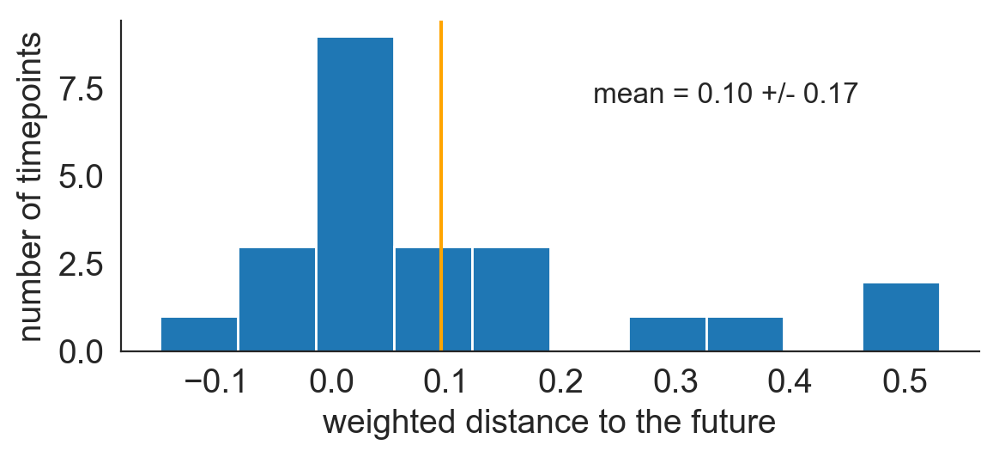

In [69]:
fig, ax = plt.subplots(1, 1, figsize=(6, 3))
ax.hist(errors_by_time_df[errors_by_time_df["predictors"] == "naive"]["validation_error"], bins=10)
ax.set_xlabel("weighted distance to the future")
ax.set_ylabel("number of timepoints")

mean_y = errors_by_time_df[errors_by_time_df["predictors"] == "naive"]["validation_error"].mean()
std_y = errors_by_time_df[errors_by_time_df["predictors"] == "naive"]["validation_error"].std()
ax.axvline(
    x=mean_y,
    color="orange"
)

ax.text(
    0.55,
    0.75,
    "mean = %.2f +/- %.2f" % (mean_y, std_y),
    transform=ax.transAxes,
    fontsize=12,
    horizontalalignment="left"
)

plt.tight_layout()
plt.savefig("../manuscript/figures/distance-of-simulated-populations-between-timepoints.png")

In [70]:
errors_by_time_df[errors_by_time_df["predictors"] == "naive"]["validation_error"].shape

(23,)

In [71]:
sum(errors_by_time_df[errors_by_time_df["predictors"] == "naive"]["validation_error"] <= 0.0)

5

In [72]:
sum(errors_by_time_df[errors_by_time_df["predictors"] == "lbi"]["validation_error"] <= 0.0)

22

Text(0.01,0.75,'best mean = -0.16')

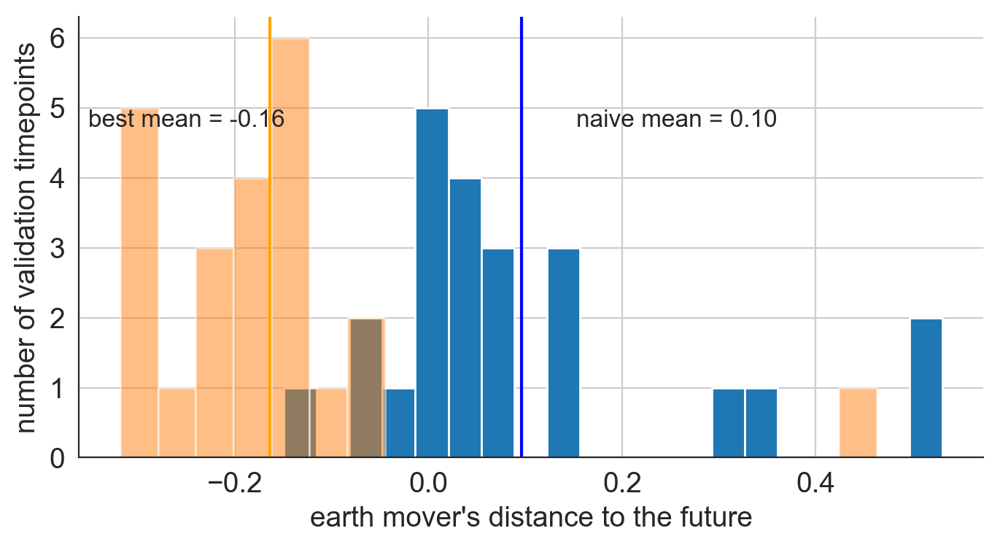

In [73]:
fig, ax = plt.subplots(1, 1, figsize=(8, 4))
ax = errors_by_time_df[errors_by_time_df["predictors"] == "naive"]["validation_error"].hist(bins=20, ax=ax)
ax.set_xlabel("earth mover's distance to the future")
ax.set_ylabel("number of validation timepoints")

mean_y = errors_by_time_df[errors_by_time_df["predictors"] == "naive"]["validation_error"].mean()
ax.axvline(
    x=mean_y,
    color="blue"
)

ax.text(
    0.55,
    0.75,
    "naive mean = %.2f" % (mean_y,),
    transform=ax.transAxes,
    fontsize=12
)

errors_by_time_df[errors_by_time_df["predictors"] == best_overall_error_model]["validation_error"].hist(
    bins=20,
    ax=ax,
    alpha=0.5
)
ax.axvline(
    x=best_overall_error,
    color="orange"
)
ax.text(
    0.01,
    0.75,
    "best mean = %.2f" % (best_overall_error,),
    transform=ax.transAxes,
    fontsize=12
)


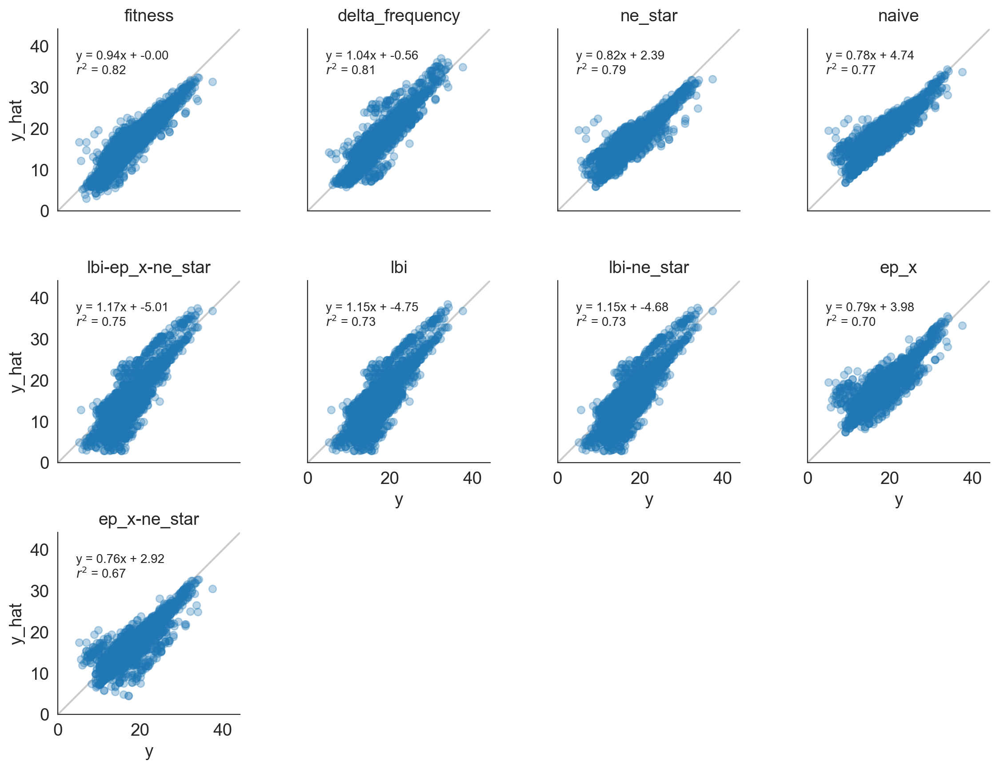

In [74]:
x = y = np.linspace(0, max_y, 10)

g = sns.FacetGrid(frequency_df, col="predictors", col_wrap=4, col_order=regressions_order)
g.map(plt.plot, "y", "y_hat", marker="o", linestyle="", alpha=0.3)
g.set_titles("{col_name}")

for ((i, j, k), facet_df), ax in zip(g.facet_data(), g.axes.flat):
    slope, intercept, r_value, p_value = regressions.loc[
        regressions["predictors"] == facet_df["predictors"].unique()[0],
        ["slope", "intercept", "r_value", "p_value"]
    ].values[0]
    
    if p_value > 0.001:
        p_value = "\nP value = %.3f" % p_value
    else:
        p_value = ""
    
    ax.plot(x, y, color="#cccccc", zorder=-10)
    
    ax.text(
        0.1,
        0.75,
        "y = %.2fx + %.2f\n$r^2$ = %.2f%s" % (slope, intercept, r_value ** 2, p_value),
        transform=ax.transAxes,
        fontsize=10
    )
    ax.set_aspect("equal")
    ax.set_xlim(0, max_y)
    ax.set_ylim(0, max_y)

In [75]:
naive_y = frequency_df.loc[frequency_df["predictors"] == "naive", ["strain", "timepoint", "y_hat"]].copy()

In [76]:
naive_y.head()

,strain,timepoint,y_hat
16205,sample_1792_1,2018-10-01,15.422031
16206,sample_1792_10,2018-10-01,16.558353
16207,sample_1792_3,2018-10-01,22.031837
16208,sample_1796_10,2018-10-01,16.452291
16209,sample_1796_2,2018-10-01,22.127211


In [77]:
frequency_df = frequency_df.merge(
    naive_y,
    on=["strain", "timepoint"],
    suffixes=["", "_naive"]
)

In [78]:
frequency_df["adjusted_y_hat"] = frequency_df["y_hat"] - frequency_df["y_hat_naive"]

In [79]:
frequency_df.shape

(20835, 17)

In [80]:
regressions_adjusted = []
for predictors, group_df in frequency_df.groupby(["predictors"]):
    slope, intercept, r_value, p_value, std_err = linregress(
        group_df["y"],
        group_df["adjusted_y_hat"]
    )
    
    regressions_adjusted.append({
        "predictors": predictors,
        "slope": slope,
        "intercept": intercept,
        "r_value": r_value,
        "r_2": r_value ** 2,
        "p_value": p_value
    })

regressions_adjusted = pd.DataFrame(regressions_adjusted).sort_values(by="r_2", ascending=False)

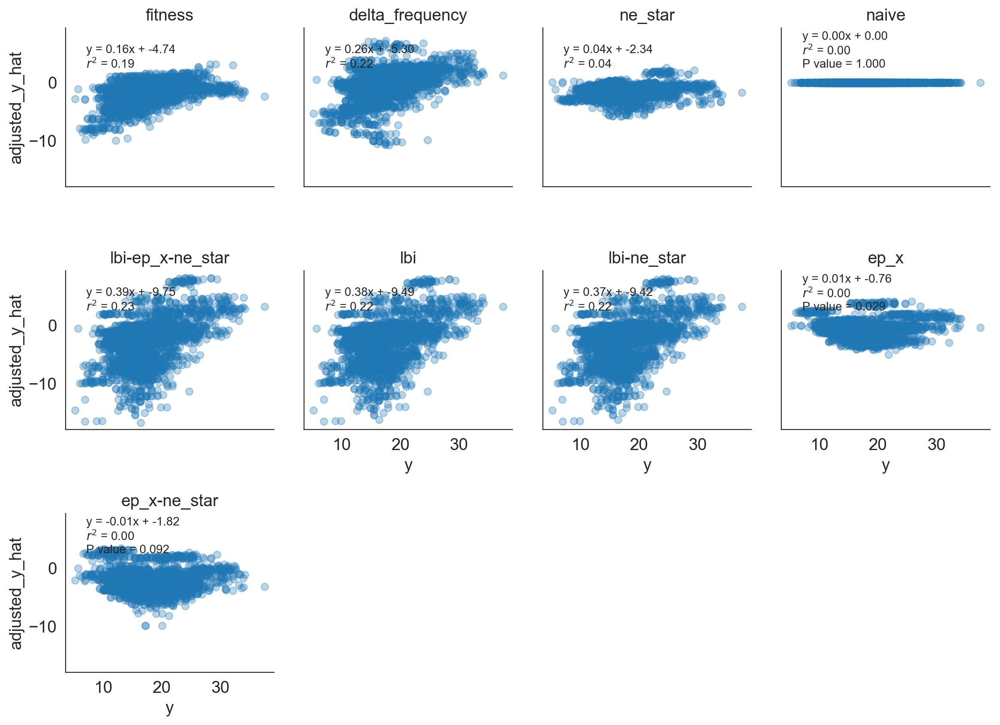

In [81]:
x = y = np.linspace(0, max_y, 10)

g = sns.FacetGrid(frequency_df, col="predictors", col_wrap=4, col_order=regressions_order)
g.map(plt.plot, "y", "adjusted_y_hat", marker="o", linestyle="", alpha=0.3)
g.set_titles("{col_name}")

for ((i, j, k), facet_df), ax in zip(g.facet_data(), g.axes.flat):
    slope, intercept, r_value, p_value = regressions_adjusted.loc[
        regressions_adjusted["predictors"] == facet_df["predictors"].unique()[0],
        ["slope", "intercept", "r_value", "p_value"]
    ].values[0]
    
    if p_value > 0.001:
        p_value = "\nP value = %.3f" % p_value
    else:
        p_value = ""
    
    #ax.plot(x, y, color="#cccccc", zorder=-10)
    
    ax.text(
        0.1,
        0.75,
        "y = %.2fx + %.2f\n$r^2$ = %.2f%s" % (slope, intercept, r_value ** 2, p_value),
        transform=ax.transAxes,
        fontsize=10
    )
    ax.set_aspect("equal")
    #ax.set_xlim(0, 10)
    #ax.set_ylim(0, )

In [82]:
best_models = list(regressions_order[:3])

In [83]:
if not "naive" in best_models:
    best_models.append("naive")

In [84]:
best_models

['fitness', 'delta_frequency', 'ne_star', 'naive']

In [85]:
frequency_df["year_month"] = frequency_df["validation_timepoint"].dt.strftime("%Y-%m")
frequency_df["year"] = frequency_df["validation_timepoint"].dt.strftime("%Y")

In [86]:
"""x = y = np.linspace(0, max_y, 10)

g = sns.FacetGrid(frequency_df[frequency_df["predictors"].isin(minimal_predictor_names_order + ["fitness"])], row="predictors", col="year_month", height=4)
g.map(plt.plot, "y", "y_hat", marker="o", linestyle="", alpha=0.3)
g.set_titles("{row_name}, {col_name}")

regressions_by_time = []
for ((i, j, k), facet_df), ax in zip(g.facet_data(), g.axes.flat):
    slope, intercept, r_value, p_value, std_err = linregress(
        facet_df["y"],
        facet_df["y_hat"]
    )
    
    regressions_by_time.append({
        "predictors": facet_df["predictors"].unique()[0],
        "timepoint": facet_df["timepoint"].unique()[0],
        "slope": slope,
        "intercept": intercept,
        "r_value": r_value,
        "p_value": p_value
    })
    
    if p_value > 0.001:
        p_value = "\nP value = %.3f" % p_value
    else:
        p_value = ""
    
    ax.plot(x, y, color="#cccccc", zorder=-10)
    
    ax.text(
        0.1,
        0.75,
        "y = %.2fx + %.2f\n$r^2$ = %.2f%s" % (slope, intercept, r_value ** 2, p_value),
        transform=ax.transAxes,
        fontsize=12
    )
    ax.set_aspect("equal")
    ax.set_xlim(0, max_y)
    ax.set_ylim(0, max_y)
    
plt.tight_layout()
plt.savefig("correlation_by_timepoint.pdf")"""

'x = y = np.linspace(0, max_y, 10)\n\ng = sns.FacetGrid(frequency_df[frequency_df["predictors"].isin(minimal_predictor_names_order + ["fitness"])], row="predictors", col="year_month", height=4)\ng.map(plt.plot, "y", "y_hat", marker="o", linestyle="", alpha=0.3)\ng.set_titles("{row_name}, {col_name}")\n\nregressions_by_time = []\nfor ((i, j, k), facet_df), ax in zip(g.facet_data(), g.axes.flat):\n    slope, intercept, r_value, p_value, std_err = linregress(\n        facet_df["y"],\n        facet_df["y_hat"]\n    )\n    \n    regressions_by_time.append({\n        "predictors": facet_df["predictors"].unique()[0],\n        "timepoint": facet_df["timepoint"].unique()[0],\n        "slope": slope,\n        "intercept": intercept,\n        "r_value": r_value,\n        "p_value": p_value\n    })\n    \n    if p_value > 0.001:\n        p_value = "\nP value = %.3f" % p_value\n    else:\n        p_value = ""\n    \n    ax.plot(x, y, color="#cccccc", zorder=-10)\n    \n    ax.text(\n        0.1,\n 

In [87]:
regressions_by_time = []
for (predictors, timepoint), group_df in frequency_df.groupby(["predictors", "timepoint"]):
    slope, intercept, r_value, p_value, std_err = linregress(
        group_df["y"],
        group_df["y_hat"]
    )
    
    regressions_by_time.append({
        "predictors": predictors,
        "timepoint": timepoint,
        "slope": slope,
        "intercept": intercept,
        "r_value": r_value,
        "p_value": p_value
    })

regressions_by_time = pd.DataFrame(regressions_by_time)

In [88]:
regressions_by_time.head()

,intercept,p_value,predictors,r_value,slope,timepoint
0,-4.406826,4.280190e-41,delta_frequency,0.914535,1.310195,2018-10-01
1,-1.109313,5.229903e-62,delta_frequency,0.968231,1.092700,2019-04-01
2,-0.094861,4.592141e-47,delta_frequency,0.937148,1.105941,2019-10-01
3,0.055270,3.764154e-42,delta_frequency,0.923506,1.105501,2020-04-01
4,-1.052251,1.908630e-89,delta_frequency,0.990755,1.093330,2020-10-01


In [89]:
naive_regressions_by_time = regressions_by_time[regressions_by_time["predictors"] == "naive"]
non_naive_regressions_by_time = regressions_by_time[regressions_by_time["predictors"] != "naive"]

## Summarize model forecasting error
[back to top](#Summarize-models)

### Earth mover's distances

Training and validation errors are reported as [earth mover's distances](https://en.wikipedia.org/wiki/Earth_mover%27s_distance). These values minimize the distance between observed and projected frequencies of tips at each timepoint with Hamming distance between amino acid sequences providing the ground distance between each pair of tips in respective timepoints.

In [90]:
distance_df = errors_by_time_df.groupby("predictors")["validation_error"].aggregate([
    "sum",
    "mean",
    "median"
]).sort_values(by="sum").reset_index()

In [91]:
distance_df

,predictors,sum,mean,median
0,lbi-ep_x-ne_star,-3.763066,-0.163612,-0.170809
1,lbi-ne_star,-3.650771,-0.158729,-0.170809
2,lbi,-3.649484,-0.158673,-0.170771
3,fitness,-1.755898,-0.076343,-0.095920
4,delta_frequency,-0.354209,-0.015400,-0.032059
5,ne_star,-0.233719,-0.010162,-0.068197
6,ep_x-ne_star,-0.167161,-0.007268,-0.089228
7,ep_x,1.922828,0.083601,0.019576
8,naive,2.204214,0.095835,0.044682


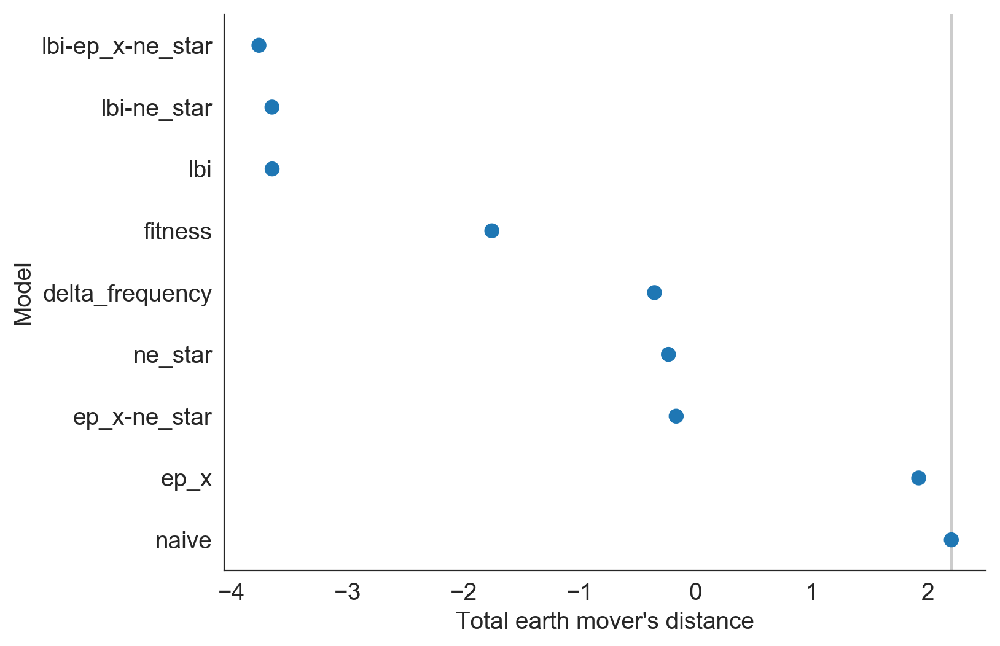

In [92]:
fig, ax = plt.subplots(1, 1, figsize=(8, 6))
sns.pointplot(
    x="sum",
    y="predictors",
    data=distance_df,
    join=False,
    ax=ax
)

ax.set_xlabel("Total earth mover's distance")
ax.set_ylabel("Model")

ax.axvline(
    x=distance_df.loc[distance_df["predictors"] == "naive", "sum"].values[0],
    color="#cccccc",
    zorder=-10
)

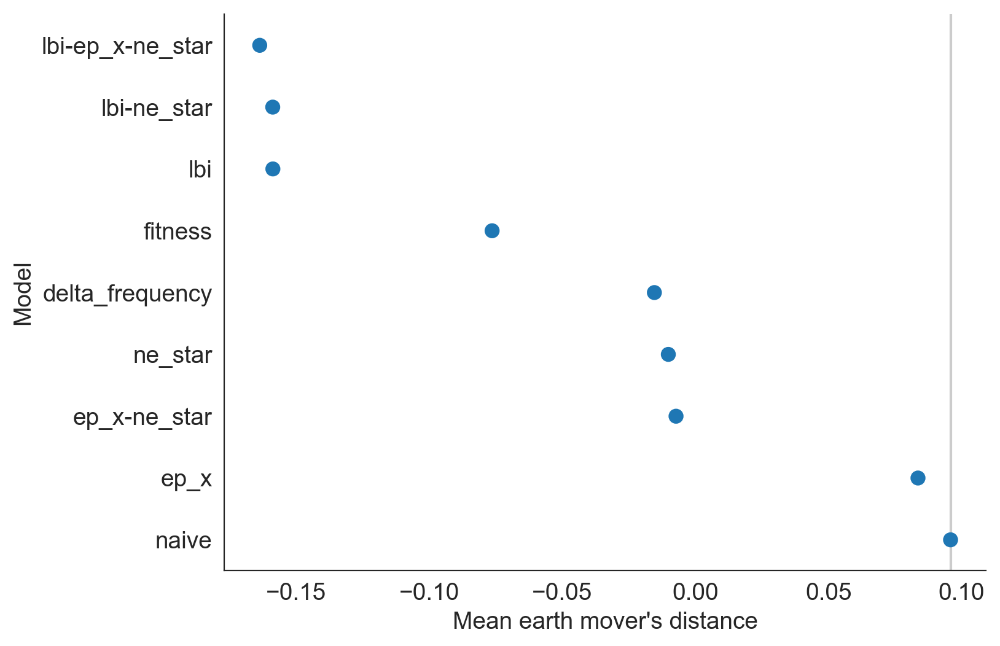

In [93]:
fig, ax = plt.subplots(1, 1, figsize=(8, 6))
sns.pointplot(
    x="mean",
    y="predictors",
    data=distance_df,
    join=False,
    ax=ax
)

ax.set_xlabel("Mean earth mover's distance")
ax.set_ylabel("Model")

ax.axvline(
    x=distance_df.loc[distance_df["predictors"] == "naive", "mean"].values[0],
    color="#cccccc",
    zorder=-10
)

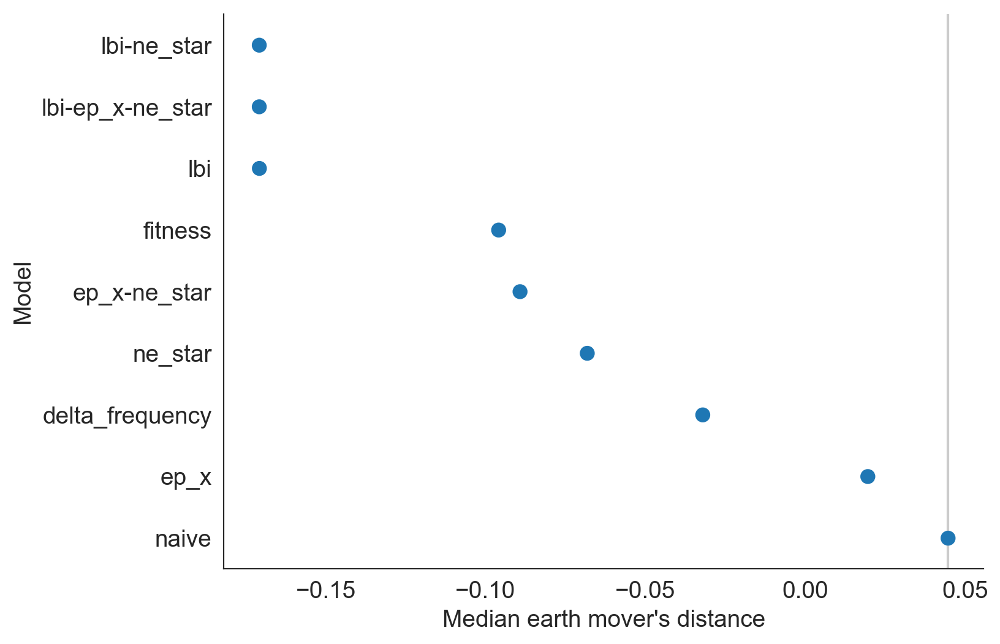

In [94]:
fig, ax = plt.subplots(1, 1, figsize=(8, 6))
sns.pointplot(
    x="median",
    y="predictors",
    data=distance_df,
    join=False,
    ax=ax,
    order=distance_df.sort_values("median").loc[:, "predictors"]
)

ax.set_xlabel("Median earth mover's distance")
ax.set_ylabel("Model")

ax.axvline(
    x=distance_df.loc[distance_df["predictors"] == "naive", "median"].values[0],
    color="#cccccc",
    zorder=-10
)

In [95]:
predictor_type_order = predictor_names_order
predictor_names = predictor_names_order

In [96]:
predictor_name_by_id = dict(zip(predictor_type_order, predictor_names))

In [97]:
errors_by_time_df["predictors_name"] = errors_by_time_df["predictors"].map(predictor_name_by_id)

In [98]:
individual_median_errors = []
for predictor in predictor_type_order:
    individual_median_errors.append(
        distance_df.loc[distance_df["predictors"] == predictor, "median"].values[0]
    )

In [99]:
median_error = errors_by_time_df.groupby("predictors")["validation_error"].median().reset_index().sort_values(by="validation_error")
median_error_order = median_error["predictors"].values

In [100]:
errors_by_time_df.loc[pd.isnull(errors_by_time_df["predictors_name"]), "predictors_name"] = errors_by_time_df.loc[
    pd.isnull(errors_by_time_df["predictors_name"]), "predictors"
]

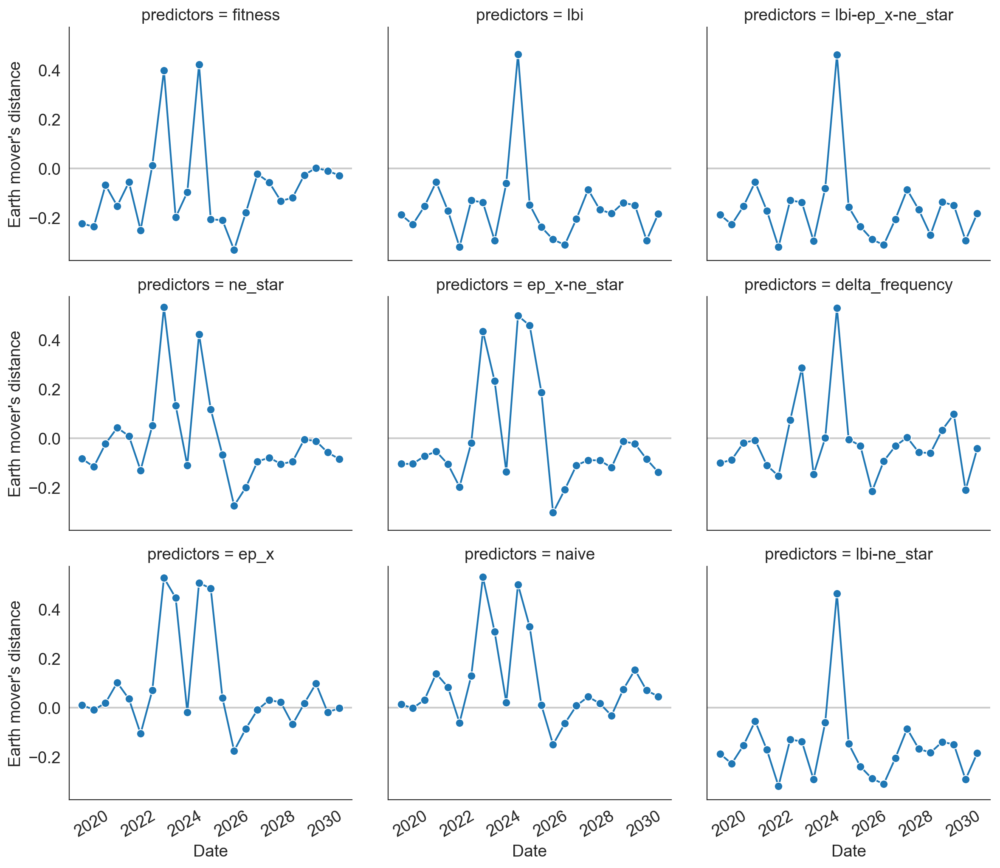

In [101]:
g = facet_time_plot(
    errors_by_time_df,
    "validation_error",
    "Earth mover's distance",
    timepoint_column="validation_timepoint",
    col_wrap=3,
    markersize=7
)

### Adjusted earth mover's distance (relative to naive model)

In [102]:
naive_error = errors_by_time_df[errors_by_time_df["predictors"] == "naive"]["validation_error"].values
for predictor in errors_by_time_df["predictors"].drop_duplicates().values:
    #adjusted_error = ((errors_by_time_df.loc[errors_by_time_df["predictors"] == predictor, "validation_error"] - naive_error) / naive_error) * 100
    adjusted_error = (errors_by_time_df.loc[errors_by_time_df["predictors"] == predictor, "validation_error"] - naive_error)
    errors_by_time_df.loc[errors_by_time_df["predictors"] == predictor, "adjusted_error"] = adjusted_error

In [103]:
naive_error

array([ 0.01350983, -0.00176956,  0.03209309,  0.13862858,  0.08384777,
       -0.0610364 ,  0.12981577,  0.53065489,  0.30848334,  0.02171632,
        0.50038333,  0.32876681,  0.01039656, -0.14951493, -0.0641944 ,
        0.00826314,  0.0446817 ,  0.01736173, -0.03177707,  0.07361377,
        0.15406599,  0.07024945,  0.04597406])

In [104]:
median_adjusted_error = errors_by_time_df.groupby("predictors")["adjusted_error"].median().reset_index().sort_values(by="adjusted_error")
median_adjusted_error_order = median_adjusted_error["predictors"].values

In [105]:
min_error = errors_by_time_df["adjusted_error"].min()

In [106]:
max_error = errors_by_time_df["adjusted_error"].max()

In [107]:
median_adjusted_error_order

array(['lbi-ep_x-ne_star', 'lbi', 'lbi-ne_star', 'fitness',
       'ep_x-ne_star', 'ne_star', 'delta_frequency', 'ep_x', 'naive'],
      dtype=object)

In [108]:
median_adjusted_error.head()

,predictors,adjusted_error
5,lbi-ep_x-ne_star,-0.228434
4,lbi,-0.225284
6,lbi-ne_star,-0.225283
3,fitness,-0.131919
2,ep_x-ne_star,-0.118515


In [109]:
minimal_median_adjusted_error_order = [
    predictor for predictor in median_adjusted_error_order
    if predictor in minimal_predictor_names_order
]

Text(0,0.5,'Model')

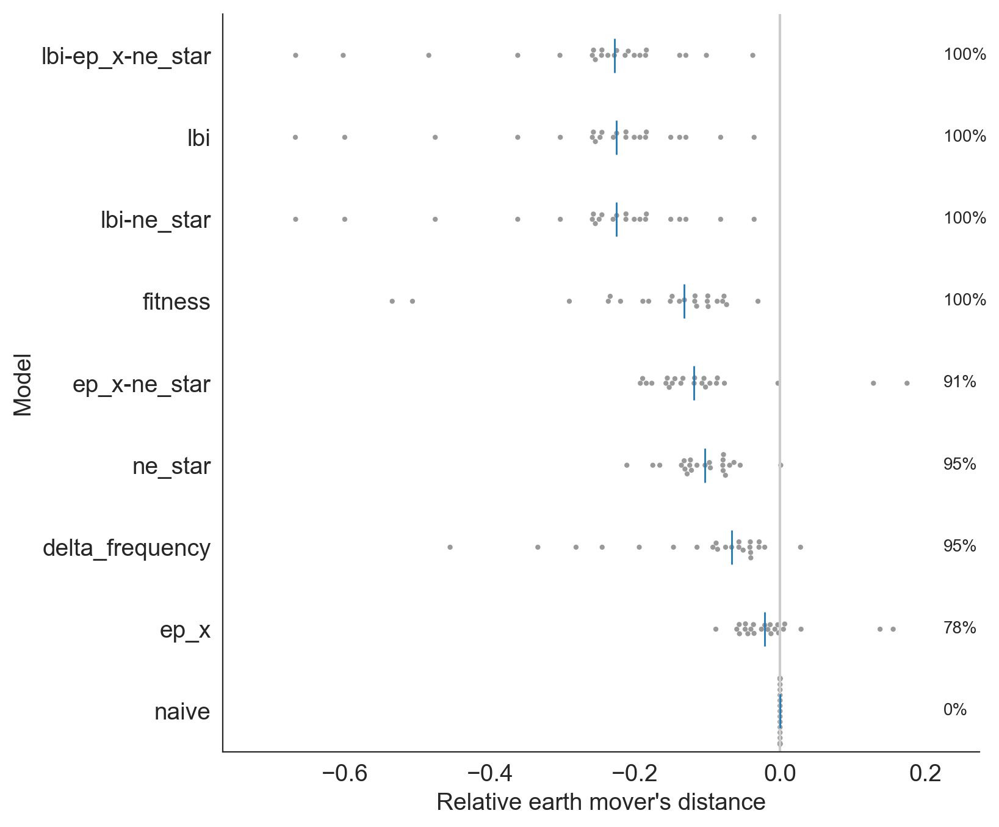

In [110]:
fig, ax = plt.subplots(1, 1, figsize=(8, 8))

ax.set_xlim(min_error - 0.1, max_error + 0.1)

ax = sns.swarmplot(
    x="adjusted_error",
    y="predictors",
    data=errors_by_time_df,
    ax=ax,
    order=median_adjusted_error_order,
    color="#999999",
    zorder=-10,
    size=3
)

ax.plot(
    median_adjusted_error["adjusted_error"],
    median_adjusted_error_order,
    marker="|",
    markersize=20,
    linestyle=""
)


#ax.text(0.5, 0, "test")
for i, predictor in enumerate(median_adjusted_error_order):
    predictor_errors = errors_by_time_df.loc[errors_by_time_df["predictors"] == predictor, "adjusted_error"]
    
    ax.text(
        max_error + 0.05,
        i,
        "%i%%" % (((predictor_errors < 0).sum() / float(predictor_errors.shape[0])) * 100),
        horizontalalignment='left',
        verticalalignment='center',
        fontsize=10
    )

ax.axvline(x=0, color="#cccccc", zorder=-10)

ax.set_xlabel("Relative earth mover's distance")
ax.set_ylabel("Model")

In [111]:
errors_by_time_df.groupby("predictors")["adjusted_error"].aggregate(["mean", "std"])

,mean,std
predictors,,
delta_frequency,-0.111236,0.116402
ep_x,-0.012234,0.056848
ep_x-ne_star,-0.103103,0.091582
fitness,-0.172179,0.126418
lbi,-0.254509,0.149579
lbi-ep_x-ne_star,-0.259447,0.147629
lbi-ne_star,-0.254565,0.149527
naive,0.000000,0.000000
ne_star,-0.105997,0.044970


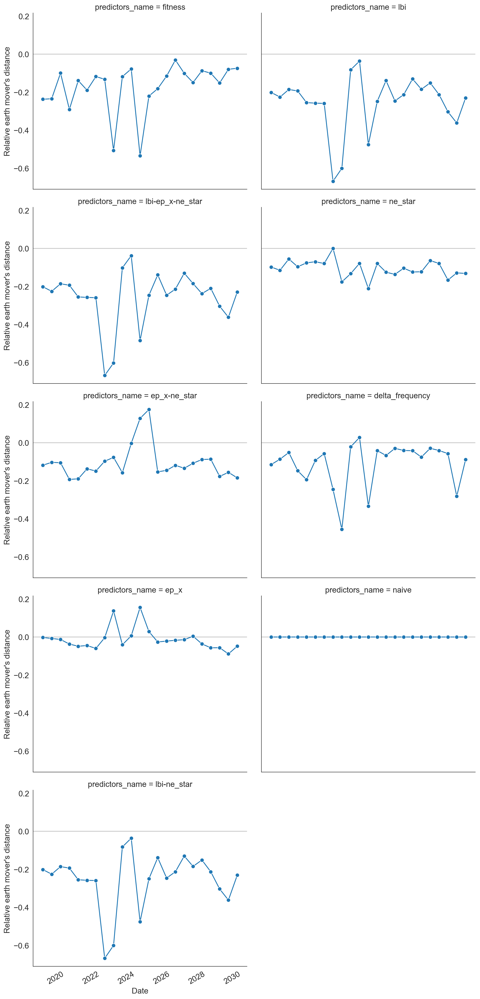

In [112]:
g = facet_time_plot(
    errors_by_time_df,
    "adjusted_error",
    "Relative earth mover's distance",
    timepoint_column="validation_timepoint",
    predictors_column="predictors_name",
    height=6,
    aspect=1,
    col_wrap=2,
    markersize=7
)
#g.set_titles("{col_name}")
#g.fig.subplots_adjust(hspace=0.2)

In [113]:
errors_and_coefficients_by_time = coefficients_by_time_df.merge(
    errors_by_time_df,
    on=["predictors", "validation_timepoint"]
)

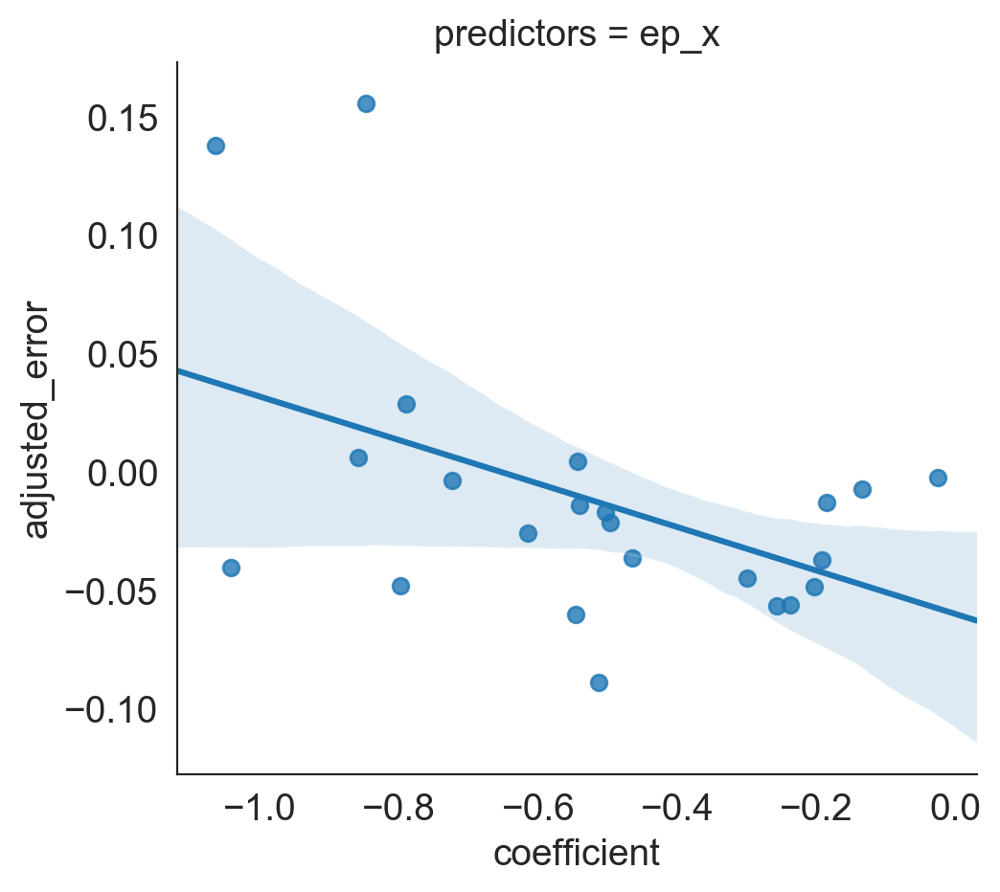

In [114]:
sns.lmplot(
    "coefficient",
    "adjusted_error",
    errors_and_coefficients_by_time,
    col="predictors",
    col_wrap=2,
    sharex=False,
    sharey=False,
    col_order=["ep_x"]
)

## Summarize model coefficients

In [115]:
overall_coefficients_df

,mean,predictor,predictors,std
0,6.565283,fitness,fitness,1.274634
1,3.551296,lbi,lbi,0.288998
2,3.435485,lbi,lbi-ep_x-ne_star,0.389899
3,-0.336277,ep_x,lbi-ep_x-ne_star,0.288011
4,-0.116263,ne_star,lbi-ep_x-ne_star,0.255210
5,-2.431710,ne_star,ne_star,0.519178
6,-0.731918,ep_x,ep_x-ne_star,0.574955
7,-2.667857,ne_star,ep_x-ne_star,0.337915
8,2.740821,delta_frequency,delta_frequency,0.572688
9,-0.516503,ep_x,ep_x,0.288055


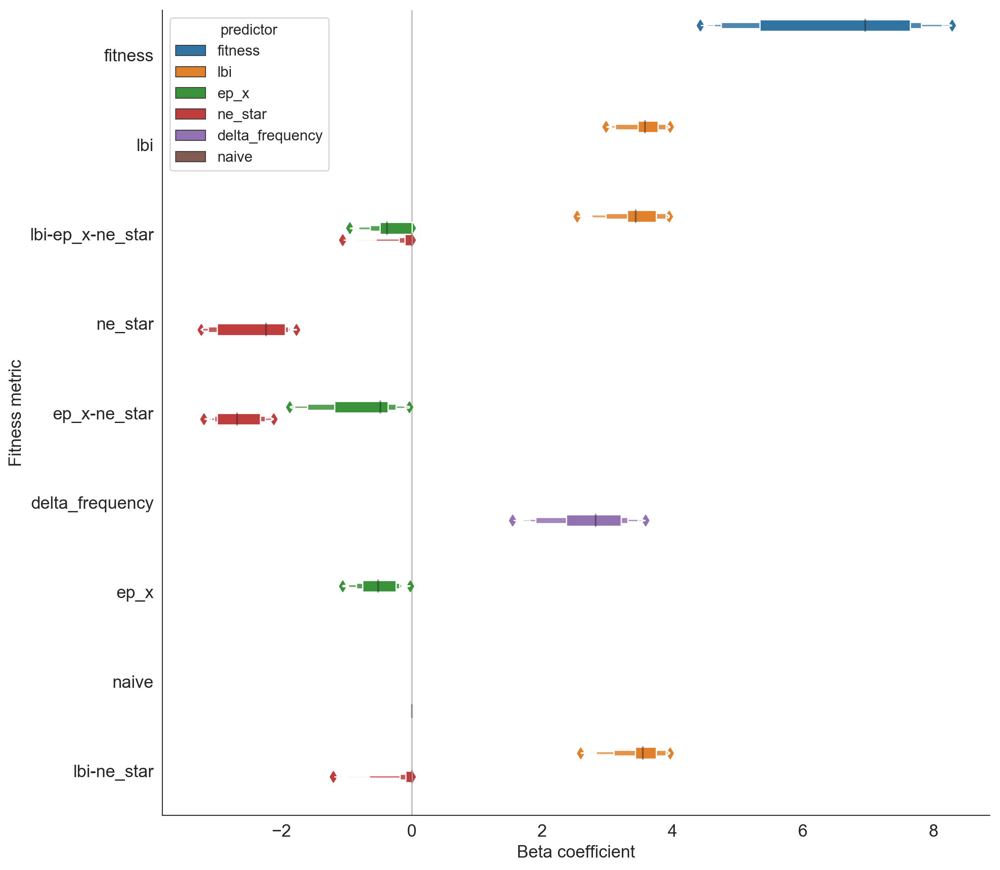

In [116]:
fig, ax = plt.subplots(1, 1, figsize=(12, 12))

#ax.set_xlim(-20, 20)
sns.boxenplot(
    y="predictors",
    x="coefficient",
    hue="predictor",
    data=coefficients_by_time_df,
    ax=ax
)

ax.axvline(0, color="#999999", alpha=0.5, zorder=-10)
ax.set_xlabel("Beta coefficient")
ax.set_ylabel("Fitness metric")

sns.despine()

In [117]:
coefficients_by_time_df["predictors_name"] = coefficients_by_time_df["predictors"].map(predictor_name_by_id)

In [118]:
coefficients_by_time_df.loc[pd.isnull(coefficients_by_time_df["predictors_name"]), "predictors_name"] = coefficients_by_time_df.loc[
    pd.isnull(coefficients_by_time_df["predictors_name"]), "predictors"
]

In [119]:
coefficients_by_time_df["predictors_name"].unique().shape

(9,)

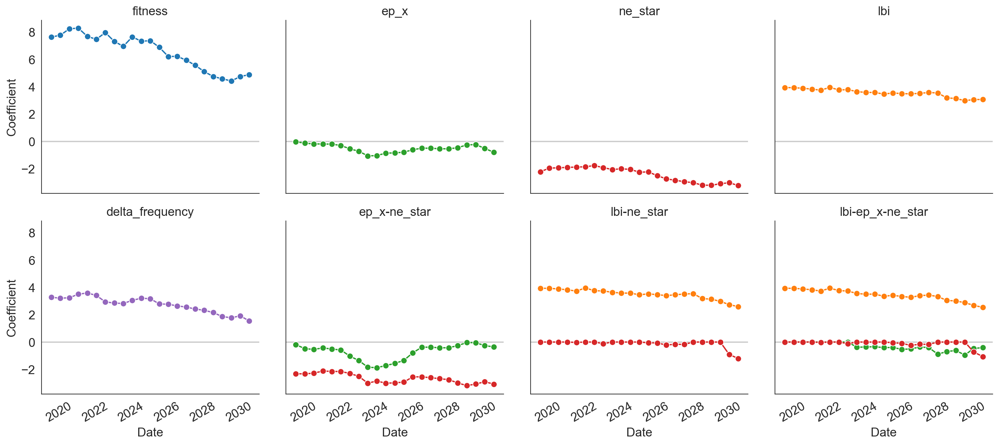

In [120]:
g = facet_time_plot(
    coefficients_by_time_df[coefficients_by_time_df["predictors"] != "naive"],
    "coefficient",
    "Coefficient",
    timepoint_column="validation_timepoint",
    predictors_column="predictors_name",
    col_order=[predictor_name_by_id[predictor] for predictor in predictor_type_order[1:]],
    hue="predictor",
    markersize=7
)
g.set_titles("{col_name}")

#for ax in g.axes.flatten():
#    ax.set_ylim(-11, 11)

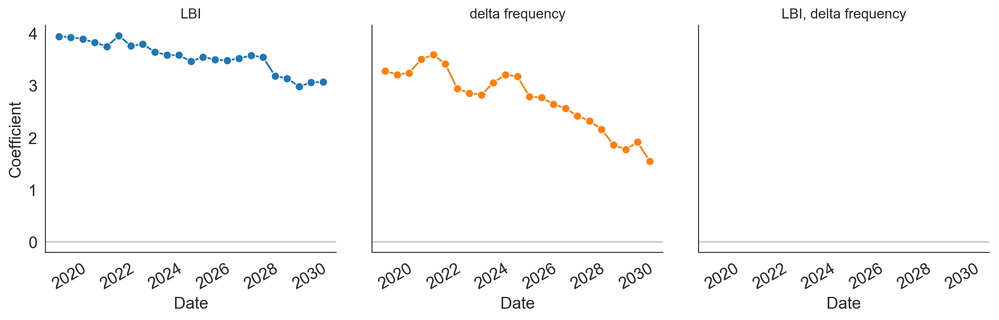

In [121]:
lbi_dfreq_order = ["lbi", "delta_frequency", "lbi-delta_frequency"]
lbi_dfreq_names = ["LBI", "delta frequency", "LBI, delta frequency"]
g = facet_time_plot(
    coefficients_by_time_df[coefficients_by_time_df["predictors"].isin(lbi_dfreq_order)],
    "coefficient",
    "Coefficient",
    timepoint_column="validation_timepoint",
    hue="predictor",
    col_order=lbi_dfreq_order,
    markersize=7
)

#g.set_titles("{col_name}")

for ci, ax in enumerate(g.axes.flatten()):
    ax.set_title(lbi_dfreq_names[ci], fontsize=12)
    #ax.set_ylim(-2., 2.)

## Summary statistics for models

In [122]:
errors_by_time_df.groupby("predictors")["adjusted_error"].aggregate(["mean", "std"])

,mean,std
predictors,,
delta_frequency,-0.111236,0.116402
ep_x,-0.012234,0.056848
ep_x-ne_star,-0.103103,0.091582
fitness,-0.172179,0.126418
lbi,-0.254509,0.149579
lbi-ep_x-ne_star,-0.259447,0.147629
lbi-ne_star,-0.254565,0.149527
naive,0.000000,0.000000
ne_star,-0.105997,0.044970


In [123]:
overall_coefficients_df

,mean,predictor,predictors,std
0,6.565283,fitness,fitness,1.274634
1,3.551296,lbi,lbi,0.288998
2,3.435485,lbi,lbi-ep_x-ne_star,0.389899
3,-0.336277,ep_x,lbi-ep_x-ne_star,0.288011
4,-0.116263,ne_star,lbi-ep_x-ne_star,0.255210
5,-2.431710,ne_star,ne_star,0.519178
6,-0.731918,ep_x,ep_x-ne_star,0.574955
7,-2.667857,ne_star,ep_x-ne_star,0.337915
8,2.740821,delta_frequency,delta_frequency,0.572688
9,-0.516503,ep_x,ep_x,0.288055


### Figure 2: Summary of models for simulated populations

In [124]:
nrows = len(individual_predictor_names_order)
ncols = 2

color_by_predictor = {
    'fitness': '#000000',
    'ep_x': '#4575b4',
    'cTiterSub_x': '#91bfdb',
    'ne_star': '#999999',
    'dms_star': '#fee090',
    'lbi': '#fc8d59',
    'delta_frequency': '#d73027'
}

name_by_predictor = {
    "fitness": "true fitness",
    "ep_x": "cross-immunity",
    "ne_star": "non-epitope mutations",
    "lbi": "LBI",
    "delta_frequency": "delta frequency"
}

In [125]:
errors_by_time_df.head()

,predictors,validation_error,validation_n,validation_timepoint,predictors_name,adjusted_error
0,fitness,-0.223293,102,2018-10-01,fitness,-0.236803
1,fitness,-0.235968,102,2019-04-01,fitness,-0.234199
2,fitness,-0.067011,101,2019-10-01,fitness,-0.099104
3,fitness,-0.151896,99,2020-04-01,fitness,-0.290525
4,fitness,-0.054867,103,2020-10-01,fitness,-0.138714


In [126]:
min_error = errors_by_time_df["adjusted_error"].min()
max_error = errors_by_time_df["adjusted_error"].max()

min_normal_error = errors_by_time_df["validation_error"].min()
max_normal_error = errors_by_time_df["validation_error"].max()

min_coefficient = coefficients_by_time_df["coefficient"].min()
max_coefficient = coefficients_by_time_df["coefficient"].max()

min_date = errors_by_time_df["validation_timepoint"].min() - np.timedelta64(6, 'M')
max_date = errors_by_time_df["validation_timepoint"].max() + np.timedelta64(6, 'M')

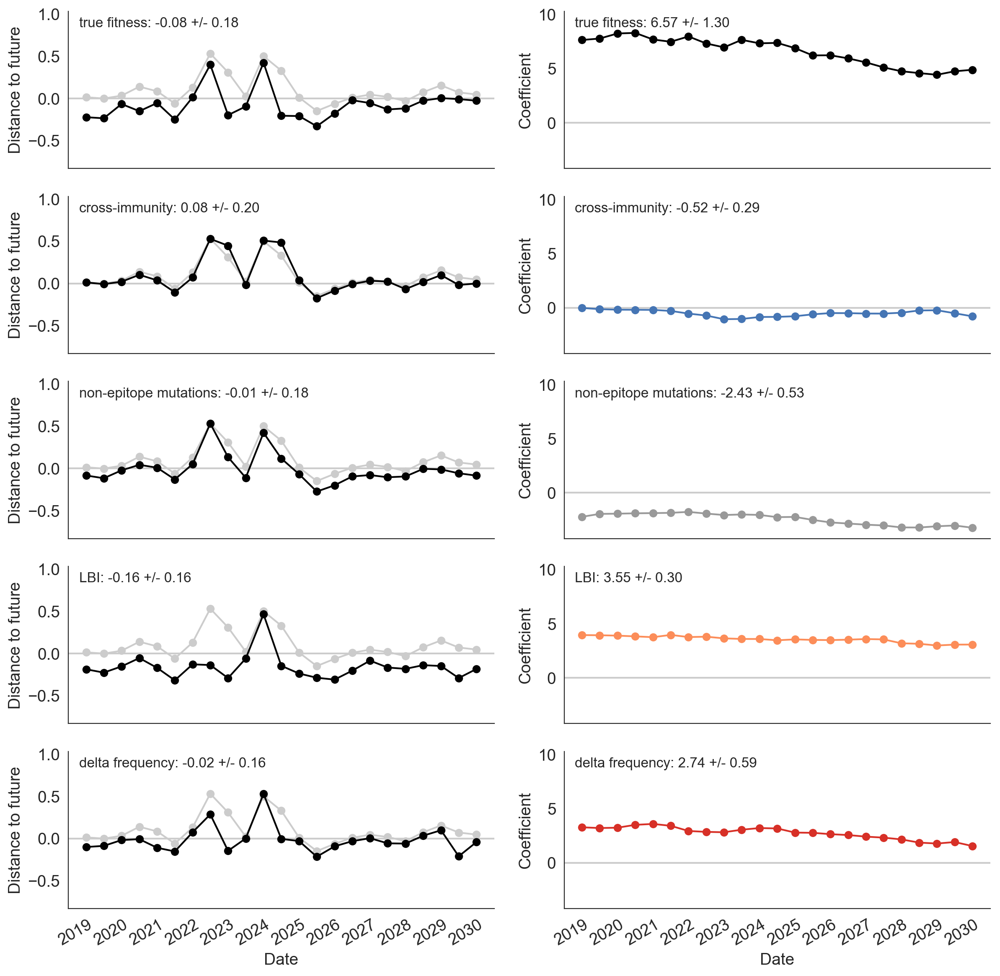

In [140]:
fig, axes = plt.subplots(figsize=(12, 12), facecolor='w')
gs = gridspec.GridSpec(
    nrows=nrows,
    ncols=ncols,
    hspace=0.1,
    wspace=0.2
)

years = mdates.YearLocator()
years_fmt = mdates.DateFormatter('%Y')
months = mdates.MonthLocator()

naive_error_df = errors_by_time_df[errors_by_time_df["predictors"] == "naive"].copy()

for i, predictor in enumerate(individual_predictor_names_order):
    error_df = errors_by_time_df[errors_by_time_df["predictors"] == predictor].copy()
    coefficient_df = coefficients_by_time_df[coefficients_by_time_df["predictors"] == predictor].copy()

    distance_ax = plt.subplot(gs[i, 0])    
    distance_ax.set_xlabel("Date")
    distance_ax.set_ylabel("Distance to future")
    distance_ax.set_ylim(min_normal_error - 0.5, max_normal_error + 0.5)
    distance_ax.text(
        0.025,
        0.9,
        "%s: %.2f +/- %.2f" % (name_by_predictor[predictor], error_df["validation_error"].mean(), error_df["validation_error"].std()),
        fontdict={"fontsize": 12},
        transform=distance_ax.transAxes
    )
    
    distance_ax.axhline(
        y=0.0,
        color="#cccccc"
    )

    distance_ax.plot(
        pd.to_datetime(naive_error_df["validation_timepoint"]).astype(np.datetime64),
        naive_error_df["validation_error"],
        "o-",
        color="#cccccc",
        zorder=-10
    )
    
    distance_ax.plot(
        pd.to_datetime(error_df["validation_timepoint"]).astype(np.datetime64),
        error_df["validation_error"],
        "o-",
        color="#000000"
    )
    
    distance_ax.set_xlim(min_date, max_date)
    distance_ax.xaxis.set_major_locator(years)
    distance_ax.xaxis.set_major_formatter(years_fmt)
    distance_ax.xaxis.set_minor_locator(months)
    distance_ax.format_xdata = mdates.DateFormatter('%Y-%m')
        
    coefficient_ax = plt.subplot(gs[i, 1])
    coefficient_ax.set_xlabel("Date")
    coefficient_ax.set_ylabel("Coefficient")
    coefficient_ax.set_ylim(min_coefficient - 1, max_coefficient + 2)

    coefficient_ax.text(
        0.025,
        0.9,
        "%s: %.2f +/- %.2f" % (name_by_predictor[predictor], coefficient_df["coefficient"].mean(), coefficient_df["coefficient"].std()),
        fontdict={"fontsize": 12},
        transform=coefficient_ax.transAxes
    )
    
    coefficient_ax.axhline(
        y=0.0,
        color="#cccccc"
    )

    coefficient_ax.plot(
        coefficient_df["validation_timepoint"],
        coefficient_df["coefficient"],
        "o-",
        color=color_by_predictor[predictor]
    )
    
    coefficient_ax.set_xlim(min_date, max_date)
    coefficient_ax.xaxis.set_major_locator(years)
    coefficient_ax.xaxis.set_major_formatter(years_fmt)
    coefficient_ax.xaxis.set_minor_locator(months)
    coefficient_ax.format_xdata = mdates.DateFormatter('%Y-%m')
    
fig.autofmt_xdate()

gs.tight_layout(fig)
plt.savefig("../manuscript/figures/unadjusted-model-accuracy-and-coefficients-for-simulated-populations.png")

# show x-axis tick lines

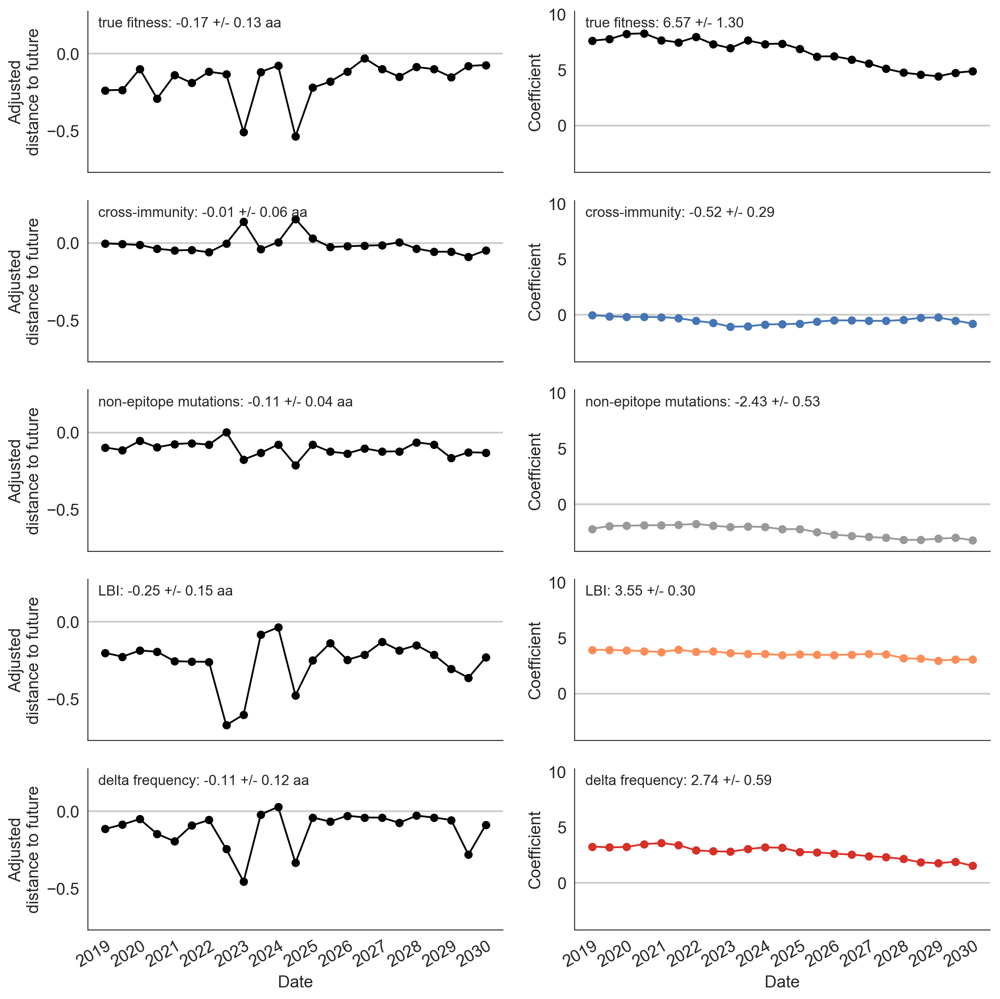

In [128]:
fig, axes = plt.subplots(figsize=(12, 12), facecolor='w')
gs = gridspec.GridSpec(
    nrows=nrows,
    ncols=ncols,
    hspace=0.1,
    wspace=0.2
)

years = mdates.YearLocator()
years_fmt = mdates.DateFormatter('%Y')
months = mdates.MonthLocator()

for i, predictor in enumerate(individual_predictor_names_order):
    error_df = errors_by_time_df[errors_by_time_df["predictors"] == predictor].copy()
    coefficient_df = coefficients_by_time_df[coefficients_by_time_df["predictors"] == predictor].copy()

    distance_ax = plt.subplot(gs[i, 0])    
    distance_ax.set_xlabel("Date")
    distance_ax.set_ylabel("Adjusted\ndistance to future")
    distance_ax.set_ylim(min_error - 0.1, max_error + 0.1)
    distance_ax.text(
        0.025,
        0.9,
        "%s: %.2f +/- %.2f aa" % (name_by_predictor[predictor], error_df["adjusted_error"].mean(), error_df["adjusted_error"].std()),
        fontdict={"fontsize": 12},
        transform=distance_ax.transAxes
    )
    
    distance_ax.axhline(
        y=0.0,
        color="#cccccc"
    )
    
    distance_ax.plot(
        pd.to_datetime(error_df["validation_timepoint"]).astype(np.datetime64),
        error_df["adjusted_error"],
        "o-",
        color="#000000"
    )
    
    distance_ax.set_xlim(min_date, max_date)
    distance_ax.xaxis.set_major_locator(years)
    distance_ax.xaxis.set_major_formatter(years_fmt)
    distance_ax.xaxis.set_minor_locator(months)
    distance_ax.format_xdata = mdates.DateFormatter('%Y-%m')
        
    coefficient_ax = plt.subplot(gs[i, 1])
    coefficient_ax.set_xlabel("Date")
    coefficient_ax.set_ylabel("Coefficient")
    coefficient_ax.set_ylim(min_coefficient - 1, max_coefficient + 2)

    coefficient_ax.text(
        0.025,
        0.9,
        "%s: %.2f +/- %.2f" % (name_by_predictor[predictor], coefficient_df["coefficient"].mean(), coefficient_df["coefficient"].std()),
        fontdict={"fontsize": 12},
        transform=coefficient_ax.transAxes
    )
    
    coefficient_ax.axhline(
        y=0.0,
        color="#cccccc"
    )

    coefficient_ax.plot(
        coefficient_df["validation_timepoint"],
        coefficient_df["coefficient"],
        "o-",
        color=color_by_predictor[predictor]
    )
    
    coefficient_ax.set_xlim(min_date, max_date)
    coefficient_ax.xaxis.set_major_locator(years)
    coefficient_ax.xaxis.set_major_formatter(years_fmt)
    coefficient_ax.xaxis.set_minor_locator(months)
    coefficient_ax.format_xdata = mdates.DateFormatter('%Y-%m')
    
fig.autofmt_xdate()

gs.tight_layout(fig)
plt.savefig("../manuscript/figures/model-accuracy-and-coefficients-for-simulated-populations.png")

# show x-axis tick lines

In [129]:
composite_predictor_names_order = ["lbi", "ep_x", "ne_star"] + [
    predictor
    for predictor in predictor_names_order
    if "-" in predictor
]

In [130]:
nrows_composite = len(composite_predictor_names_order)

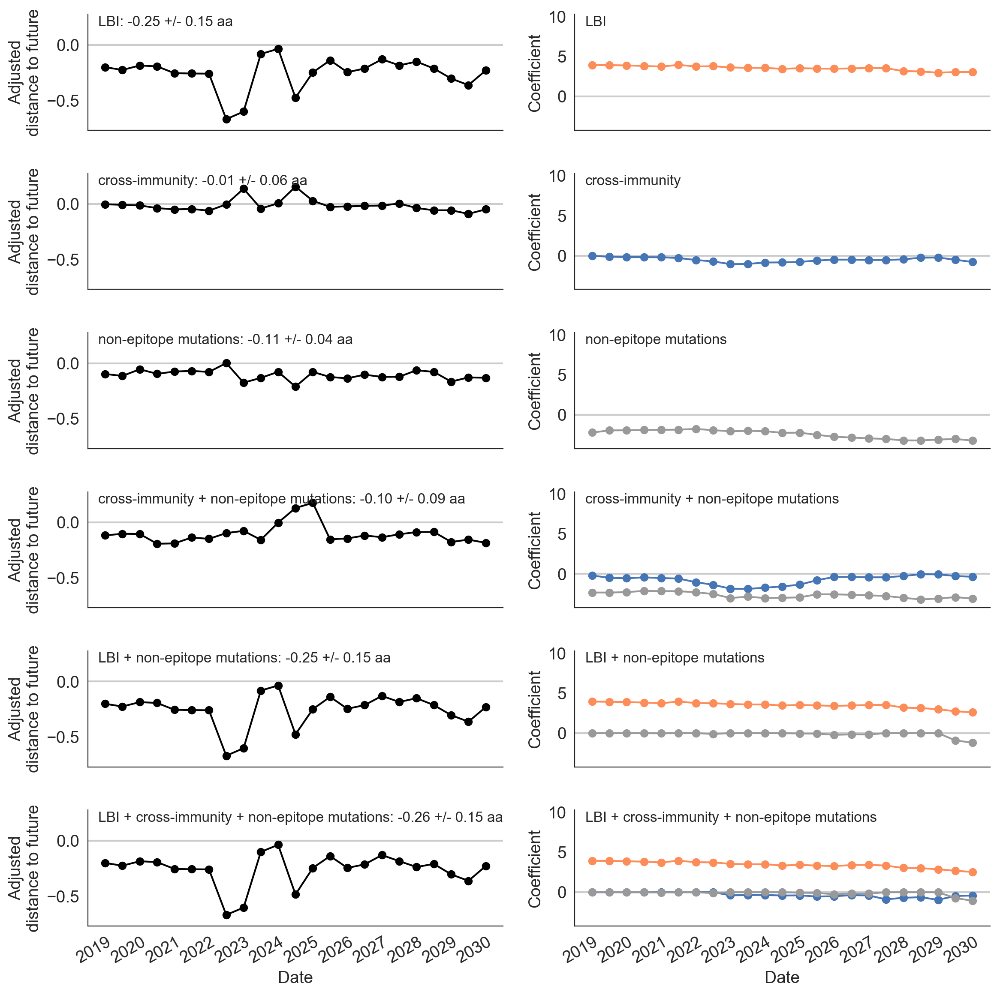

In [131]:
fig, axes = plt.subplots(figsize=(12, 12), facecolor='w')
gs = gridspec.GridSpec(
    nrows=nrows_composite,
    ncols=ncols,
    hspace=0.1,
    wspace=0.2
)

years = mdates.YearLocator()
years_fmt = mdates.DateFormatter('%Y')
months = mdates.MonthLocator()

for i, predictor in enumerate(composite_predictor_names_order):
    error_df = errors_by_time_df[errors_by_time_df["predictors"] == predictor].copy()
    coefficient_df = coefficients_by_time_df[coefficients_by_time_df["predictors"] == predictor].copy()
    composite_predictors = predictor.split("-")
    composite_predictors_name = " + ".join([name_by_predictor[predictor_name] for predictor_name in composite_predictors])

    distance_ax = plt.subplot(gs[i, 0])    
    distance_ax.set_xlabel("Date")
    distance_ax.set_ylabel("Adjusted\ndistance to future")
    distance_ax.set_ylim(min_error - 0.1, max_error + 0.1)
    distance_ax.text(
        0.025,
        0.9,
        "%s: %.2f +/- %.2f aa" % (composite_predictors_name, error_df["adjusted_error"].mean(), error_df["adjusted_error"].std()),
        fontdict={"fontsize": 12},
        transform=distance_ax.transAxes
    )
    
    distance_ax.axhline(
        y=0.0,
        color="#cccccc"
    )
    
    distance_ax.plot(
        pd.to_datetime(error_df["validation_timepoint"]).astype(np.datetime64),
        error_df["adjusted_error"],
        "o-",
        color="#000000"
    )
    
    distance_ax.set_xlim(min_date, max_date)
    distance_ax.xaxis.set_major_locator(years)
    distance_ax.xaxis.set_major_formatter(years_fmt)
    distance_ax.xaxis.set_minor_locator(months)
    distance_ax.format_xdata = mdates.DateFormatter('%Y-%m')
        
    coefficient_ax = plt.subplot(gs[i, 1])
    coefficient_ax.set_xlabel("Date")
    coefficient_ax.set_ylabel("Coefficient")
    coefficient_ax.set_ylim(min_coefficient - 1, max_coefficient + 2)

    coefficient_ax.text(
        0.025,
        0.9,
        "%s" % (composite_predictors_name,),
        fontdict={"fontsize": 12},
        transform=coefficient_ax.transAxes
    )
    
    coefficient_ax.axhline(
        y=0.0,
        color="#cccccc"
    )

    for predictor, predictor_coefficient_df in coefficient_df.groupby("predictor"):
        coefficient_ax.plot(
            predictor_coefficient_df["validation_timepoint"],
            predictor_coefficient_df["coefficient"],
            "o-",
            color=color_by_predictor[predictor]
        )
    
    coefficient_ax.set_xlim(min_date, max_date)
    coefficient_ax.xaxis.set_major_locator(years)
    coefficient_ax.xaxis.set_major_formatter(years_fmt)
    coefficient_ax.xaxis.set_minor_locator(months)
    coefficient_ax.format_xdata = mdates.DateFormatter('%Y-%m')
    
fig.autofmt_xdate()

gs.tight_layout(fig)
plt.savefig("../manuscript/figures/composite-model-accuracy-and-coefficients-for-simulated-populations.png")

# show x-axis tick lines

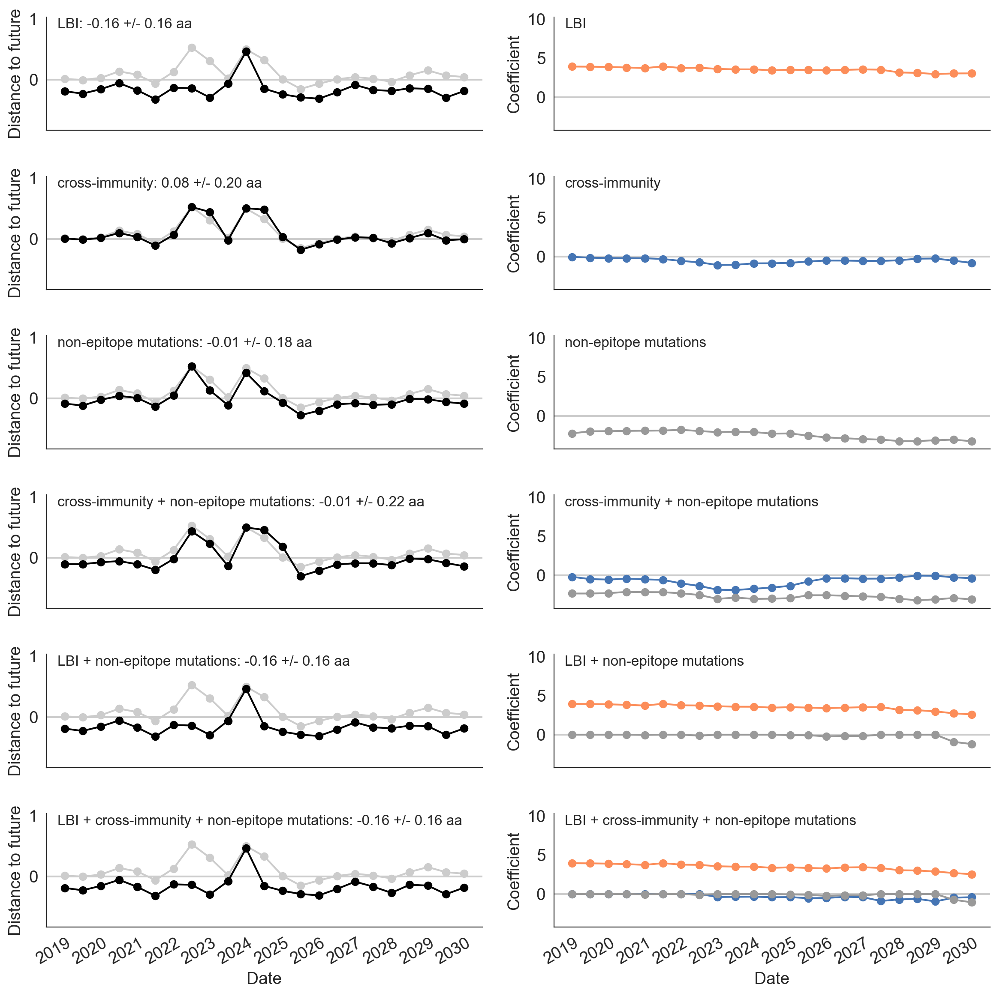

In [141]:
fig, axes = plt.subplots(figsize=(12, 12), facecolor='w')
gs = gridspec.GridSpec(
    nrows=nrows_composite,
    ncols=ncols,
    hspace=0.1,
    wspace=0.2
)

years = mdates.YearLocator()
years_fmt = mdates.DateFormatter('%Y')
months = mdates.MonthLocator()

naive_error_df = errors_by_time_df[errors_by_time_df["predictors"] == "naive"].copy()

for i, predictor in enumerate(composite_predictor_names_order):
    error_df = errors_by_time_df[errors_by_time_df["predictors"] == predictor].copy()
    coefficient_df = coefficients_by_time_df[coefficients_by_time_df["predictors"] == predictor].copy()
    composite_predictors = predictor.split("-")
    composite_predictors_name = " + ".join([name_by_predictor[predictor_name] for predictor_name in composite_predictors])

    distance_ax = plt.subplot(gs[i, 0])    
    distance_ax.set_xlabel("Date")
    distance_ax.set_ylabel("Distance to future")
    distance_ax.set_ylim(min_normal_error - 0.5, max_normal_error + 0.5)
    distance_ax.text(
        0.025,
        0.9,
        "%s: %.2f +/- %.2f aa" % (composite_predictors_name, error_df["validation_error"].mean(), error_df["validation_error"].std()),
        fontdict={"fontsize": 12},
        transform=distance_ax.transAxes
    )
    
    distance_ax.axhline(
        y=0.0,
        color="#cccccc"
    )
    
    distance_ax.plot(
        pd.to_datetime(naive_error_df["validation_timepoint"]).astype(np.datetime64),
        naive_error_df["validation_error"],
        "o-",
        color="#cccccc",
        zorder=-10
    )
    
    distance_ax.plot(
        pd.to_datetime(error_df["validation_timepoint"]).astype(np.datetime64),
        error_df["validation_error"],
        "o-",
        color="#000000"
    )
    
    distance_ax.set_xlim(min_date, max_date)
    distance_ax.xaxis.set_major_locator(years)
    distance_ax.xaxis.set_major_formatter(years_fmt)
    distance_ax.xaxis.set_minor_locator(months)
    distance_ax.format_xdata = mdates.DateFormatter('%Y-%m')
        
    coefficient_ax = plt.subplot(gs[i, 1])
    coefficient_ax.set_xlabel("Date")
    coefficient_ax.set_ylabel("Coefficient")
    coefficient_ax.set_ylim(min_coefficient - 1, max_coefficient + 2)

    coefficient_ax.text(
        0.025,
        0.9,
        "%s" % (composite_predictors_name,),
        fontdict={"fontsize": 12},
        transform=coefficient_ax.transAxes
    )
    
    coefficient_ax.axhline(
        y=0.0,
        color="#cccccc"
    )

    for predictor, predictor_coefficient_df in coefficient_df.groupby("predictor"):
        coefficient_ax.plot(
            predictor_coefficient_df["validation_timepoint"],
            predictor_coefficient_df["coefficient"],
            "o-",
            color=color_by_predictor[predictor]
        )
    
    coefficient_ax.set_xlim(min_date, max_date)
    coefficient_ax.xaxis.set_major_locator(years)
    coefficient_ax.xaxis.set_major_formatter(years_fmt)
    coefficient_ax.xaxis.set_minor_locator(months)
    coefficient_ax.format_xdata = mdates.DateFormatter('%Y-%m')
    
fig.autofmt_xdate()

gs.tight_layout(fig)
plt.savefig("../manuscript/figures/unadjusted-composite-model-accuracy-and-coefficients-for-simulated-populations.png")

# show x-axis tick lines

In [132]:
X = pd.DataFrame(models_by_predictors["ep_x"]["scores"][10]["training_data"]["X"])

KeyError: 'X'

In [ ]:
model = DistanceExponentialGrowthModel(["ep_x"], 1.0, 0.5, lambda x: x, {})

In [ ]:
mean_stds = model.calculate_mean_stds(X, model.predictors)

In [ ]:
mean_stds

In [ ]:
X.loc[:, ["timepoint"] + model.predictors].groupby("timepoint").std()

In [ ]:
standard_dfs = []
for timepoint, timepoint_df in X.groupby("timepoint"):
    predictors = timepoint_df.loc[:, model.predictors].values
    standardized_predictors = model.standardize_predictors(predictors, mean_stds)
    
    standard_df = pd.DataFrame({"predictor": standardized_predictors[:, 0].tolist()})
    standard_df["timepoint"] = timepoint
    standard_dfs.append(standard_df)

In [ ]:
standard_dfs = pd.concat(standard_dfs)

In [ ]:
plt.hist(predictors, bins=10)

In [ ]:
predictors.mean()

In [ ]:
standardized_predictors.shape

In [ ]:
plt.hist(standardized_predictors, bins=10)

In [ ]:
bins = np.linspace(-5, 5, 20)

In [ ]:
g = sns.FacetGrid(standard_dfs, col="timepoint", col_wrap=5)
g.map(sns.distplot, "predictor", bins=bins, kde=False)

In [ ]:
X = pd.DataFrame(models_by_predictors["lbi"]["scores"][0]["training_data"]["X"])
model = DistanceExponentialGrowthModel(["lbi"], 1.0, 0.5, lambda x: x, {})
mean_stds = model.calculate_mean_stds(X, model.predictors)

standard_dfs = []
for timepoint, timepoint_df in X.groupby("timepoint"):
    predictors = timepoint_df.loc[:, model.predictors].values
    standardized_predictors = model.standardize_predictors(predictors, mean_stds)
    
    standard_df = pd.DataFrame({"predictor": standardized_predictors[:, 0].tolist()})
    standard_df["timepoint"] = timepoint
    standard_dfs.append(standard_df)

standard_dfs = pd.concat(standard_dfs)

In [ ]:
g = sns.FacetGrid(standard_dfs, col="timepoint", col_wrap=5)
g.map(sns.distplot, "predictor", bins=bins, kde=False)